In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_absolute_error


from prophet import Prophet
from xgboost import XGBRegressor

In [4]:
#pip install darts

In [ ]:
df1=pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2014.csv')

In [ ]:
df2 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2015.csv')

In [ ]:
df3 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2016.csv')

In [ ]:
df4 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2017.csv')

In [ ]:
df5 =  pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2018.csv')

In [ ]:
df6 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2019.csv')

In [ ]:
df7 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2020.csv')

In [ ]:
df8 =pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2021.csv')

In [ ]:
df9 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2022.csv')

In [14]:
sandiego_df1 = df1[(df1['fips_code'] == 6073) & (df1['county'] == 'San Diego')]

In [15]:
sandiego_df1['run_start_time'] = pd.to_datetime(sandiego_df1['run_start_time'])

C:\Users\halee\AppData\Local\Temp\ipykernel_328\2952790455.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sandiego_df1['run_start_time'] = pd.to_datetime(sandiego_df1['run_start_time'])


In [16]:
# Convert run_start_time to datetime format
sandiego_df1['run_start_time'] = pd.to_datetime(sandiego_df1['run_start_time'])

# Set the run_start_time column as the DataFrame index
sandiego_df1.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_328\1902342349.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sandiego_df1['run_start_time'] = pd.to_datetime(sandiego_df1['run_start_time'])


In [17]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_san_diego1 = sandiego_df1.resample('D')['sum'].max()

In [18]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df1 = daily_max_outages_san_diego1.to_frame().reset_index()

In [19]:
# Rename the columns for clarity
daily_max_outages_san_diego_df1.columns = ['Date', 'Highest_Outage']

In [20]:

print(daily_max_outages_san_diego_df1)

         Date  Highest_Outage
0  2014-11-01            3191
1  2014-11-02             251
2  2014-11-03             205
3  2014-11-04             659
4  2014-11-05            1769
..        ...             ...
56 2014-12-27            4212
57 2014-12-28             226
58 2014-12-29            1699
59 2014-12-30            1593
60 2014-12-31            1593

[61 rows x 2 columns]


In [21]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_san_diego1 = sandiego_df1.resample('H')['sum'].max()

In [22]:
# Create a new DataFrame from the resampled data
hourly_max_outages_san_diego_df1 = hourly_max_outages_san_diego1.to_frame().reset_index()

In [23]:
# Rename the columns for clarity
hourly_max_outages_san_diego_df1.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_san_diego_df1)

                    Date  Highest_Outage
0    2014-11-01 06:00:00           377.0
1    2014-11-01 07:00:00             NaN
2    2014-11-01 08:00:00             NaN
3    2014-11-01 09:00:00             NaN
4    2014-11-01 10:00:00             NaN
...                  ...             ...
1430 2014-12-30 20:00:00           185.0
1431 2014-12-30 21:00:00           177.0
1432 2014-12-30 22:00:00           134.0
1433 2014-12-30 23:00:00          1593.0
1434 2014-12-31 00:00:00          1593.0

[1435 rows x 2 columns]


In [24]:
hourly_max_outages_san_diego1 = hourly_max_outages_san_diego_df1.fillna(0)

In [25]:
hourly_max_outages_san_diego1

,Date,Highest_Outage
0,2014-11-01 06:00:00,377.0
1,2014-11-01 07:00:00,0.0
2,2014-11-01 08:00:00,0.0
3,2014-11-01 09:00:00,0.0
4,2014-11-01 10:00:00,0.0
...,...,...
1430,2014-12-30 20:00:00,185.0
1431,2014-12-30 21:00:00,177.0
1432,2014-12-30 22:00:00,134.0
1433,2014-12-30 23:00:00,1593.0


In [26]:
sandiego_df2 = df2[(df2['fips_code'] == 6073) & (df2['county'] == 'San Diego')]

In [27]:
# Convert run_start_time to datetime format
sandiego_df2['run_start_time'] = pd.to_datetime(sandiego_df2['run_start_time'])

# Set the run_start_time column as the DataFrame index
sandiego_df2.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_328\4224898449.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sandiego_df2['run_start_time'] = pd.to_datetime(sandiego_df2['run_start_time'])


In [28]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_san_diego2 = sandiego_df2.resample('D')['sum'].max()

In [29]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df2 = daily_max_outages_san_diego2.to_frame().reset_index()

In [30]:
# Rename the columns for clarity
daily_max_outages_san_diego_df2.columns = ['Date', 'Highest_Outage']

In [31]:

print(daily_max_outages_san_diego_df2)

          Date  Highest_Outage
0   2015-01-01          4432.0
1   2015-01-02          1718.0
2   2015-01-03           385.0
3   2015-01-04          1091.0
4   2015-01-05          1258.0
..         ...             ...
360 2015-12-27           975.0
361 2015-12-28          1066.0
362 2015-12-29           292.0
363 2015-12-30          4989.0
364 2015-12-31           112.0

[365 rows x 2 columns]


In [32]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_san_diego2= sandiego_df2.resample('H')['sum'].max()

In [33]:
# Create a new DataFrame from the resampled data
hourly_max_outages_san_diego_df2 = hourly_max_outages_san_diego2.to_frame().reset_index()

In [34]:
# Rename the columns for clarity
hourly_max_outages_san_diego_df2.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_san_diego_df2)

                    Date  Highest_Outage
0    2015-01-01 05:00:00           126.0
1    2015-01-01 06:00:00           126.0
2    2015-01-01 07:00:00             2.0
3    2015-01-01 08:00:00             NaN
4    2015-01-01 09:00:00             NaN
...                  ...             ...
8727 2015-12-30 20:00:00           178.0
8728 2015-12-30 21:00:00           195.0
8729 2015-12-30 22:00:00           178.0
8730 2015-12-30 23:00:00           112.0
8731 2015-12-31 00:00:00           112.0

[8732 rows x 2 columns]


In [35]:
hourly_max_outages_san_diego2 = hourly_max_outages_san_diego_df2.fillna(0)

In [36]:
hourly_max_outages_san_diego2

,Date,Highest_Outage
0,2015-01-01 05:00:00,126.0
1,2015-01-01 06:00:00,126.0
2,2015-01-01 07:00:00,2.0
3,2015-01-01 08:00:00,0.0
4,2015-01-01 09:00:00,0.0
...,...,...
8727,2015-12-30 20:00:00,178.0
8728,2015-12-30 21:00:00,195.0
8729,2015-12-30 22:00:00,178.0
8730,2015-12-30 23:00:00,112.0


In [37]:
sandiego_df3 = df3[(df3['fips_code'] == 6073) & (df3['county'] == 'San Diego')]

In [38]:
# Convert run_start_time to datetime format
sandiego_df3['run_start_time'] = pd.to_datetime(sandiego_df3['run_start_time'])

# Set the run_start_time column as the DataFrame index
sandiego_df3.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_328\3611938441.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sandiego_df3['run_start_time'] = pd.to_datetime(sandiego_df3['run_start_time'])


In [39]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_san_diego3 = sandiego_df3.resample('D')['sum'].max()

In [40]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df3 = daily_max_outages_san_diego3.to_frame().reset_index()

In [41]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df3 = daily_max_outages_san_diego3.to_frame().reset_index()

In [42]:

print(daily_max_outages_san_diego_df3)

    run_start_time    sum
0       2016-01-01   4176
1       2016-01-02   1922
2       2016-01-03    618
3       2016-01-04    316
4       2016-01-05   6054
..             ...    ...
360     2016-12-26  10763
361     2016-12-27    899
362     2016-12-28   3420
363     2016-12-29    434
364     2016-12-30   2713

[365 rows x 2 columns]


In [43]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_san_diego3= sandiego_df3.resample('H')['sum'].max()

In [44]:
# Create a new DataFrame from the resampled data
hourly_max_outages_san_diego_df3 = hourly_max_outages_san_diego3.to_frame().reset_index()

In [45]:
# Rename the columns for clarity
hourly_max_outages_san_diego_df3.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_san_diego_df3)

                    Date  Highest_Outage
0    2016-01-01 18:00:00             1.0
1    2016-01-01 19:00:00             1.0
2    2016-01-01 20:00:00             1.0
3    2016-01-01 21:00:00             1.0
4    2016-01-01 22:00:00          1422.0
...                  ...             ...
8735 2016-12-30 17:00:00           539.0
8736 2016-12-30 18:00:00          2493.0
8737 2016-12-30 19:00:00            43.0
8738 2016-12-30 20:00:00            20.0
8739 2016-12-30 21:00:00            20.0

[8740 rows x 2 columns]


In [46]:
hourly_max_outages_san_diego3 = hourly_max_outages_san_diego_df3.fillna(0)

In [47]:
hourly_max_outages_san_diego3

,Date,Highest_Outage
0,2016-01-01 18:00:00,1.0
1,2016-01-01 19:00:00,1.0
2,2016-01-01 20:00:00,1.0
3,2016-01-01 21:00:00,1.0
4,2016-01-01 22:00:00,1422.0
...,...,...
8735,2016-12-30 17:00:00,539.0
8736,2016-12-30 18:00:00,2493.0
8737,2016-12-30 19:00:00,43.0
8738,2016-12-30 20:00:00,20.0


In [48]:
sandiego_df4 = df4[(df4['fips_code'] == 6073) & (df4['county'] == 'San Diego')]

In [49]:
# Convert run_start_time to datetime format
sandiego_df4['run_start_time'] = pd.to_datetime(sandiego_df4['run_start_time'])

# Set the run_start_time column as the DataFrame index
sandiego_df4.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_328\3543013722.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sandiego_df4['run_start_time'] = pd.to_datetime(sandiego_df4['run_start_time'])


In [50]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_san_diego4 = sandiego_df4.resample('D')['sum'].max()

In [51]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df4 = daily_max_outages_san_diego4.to_frame().reset_index()

In [52]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df4 = daily_max_outages_san_diego4.to_frame().reset_index()

In [53]:
print(daily_max_outages_san_diego_df4)

    run_start_time     sum
0       2017-01-01  2516.0
1       2017-01-02   358.0
2       2017-01-03   487.0
3       2017-01-04  3094.0
4       2017-01-05   372.0
..             ...     ...
360     2017-12-27   154.0
361     2017-12-28   168.0
362     2017-12-29   433.0
363     2017-12-30    92.0
364     2017-12-31     1.0

[365 rows x 2 columns]


In [54]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_san_diego4= sandiego_df4.resample('H')['sum'].max()

In [55]:
# Create a new DataFrame from the resampled data
hourly_max_outages_san_diego_df4 = hourly_max_outages_san_diego4.to_frame().reset_index()

In [56]:
# Rename the columns for clarity
hourly_max_outages_san_diego_df4.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_san_diego_df4)

                    Date  Highest_Outage
0    2017-01-01 00:00:00           412.0
1    2017-01-01 01:00:00          2516.0
2    2017-01-01 02:00:00          1634.0
3    2017-01-01 03:00:00          1634.0
4    2017-01-01 04:00:00           213.0
...                  ...             ...
8732 2017-12-30 20:00:00             7.0
8733 2017-12-30 21:00:00             7.0
8734 2017-12-30 22:00:00             1.0
8735 2017-12-30 23:00:00             1.0
8736 2017-12-31 00:00:00             1.0

[8737 rows x 2 columns]


In [57]:
hourly_max_outages_san_diego4 = hourly_max_outages_san_diego_df4.fillna(0)

In [58]:
hourly_max_outages_san_diego4

,Date,Highest_Outage
0,2017-01-01 00:00:00,412.0
1,2017-01-01 01:00:00,2516.0
2,2017-01-01 02:00:00,1634.0
3,2017-01-01 03:00:00,1634.0
4,2017-01-01 04:00:00,213.0
...,...,...
8732,2017-12-30 20:00:00,7.0
8733,2017-12-30 21:00:00,7.0
8734,2017-12-30 22:00:00,1.0
8735,2017-12-30 23:00:00,1.0


In [59]:
sandiego_df5 = df5[(df5['fips_code'] == 6073) & (df5['county'] == 'San Diego')]

In [60]:
# Convert run_start_time to datetime format
sandiego_df5['run_start_time'] = pd.to_datetime(sandiego_df5['run_start_time'])

# Set the run_start_time column as the DataFrame index
sandiego_df5.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_328\4223640805.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sandiego_df5['run_start_time'] = pd.to_datetime(sandiego_df5['run_start_time'])


In [61]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_san_diego5 = sandiego_df5.resample('D')['sum'].max()

In [62]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df5 = daily_max_outages_san_diego5.to_frame().reset_index()

In [63]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df5 = daily_max_outages_san_diego5.to_frame().reset_index()

In [64]:
print(daily_max_outages_san_diego_df5)

    run_start_time     sum
0       2018-01-01  1149.0
1       2018-01-02   325.0
2       2018-01-03  1476.0
3       2018-01-04  1977.0
4       2018-01-05  1858.0
..             ...     ...
360     2018-12-27   449.0
361     2018-12-28  3353.0
362     2018-12-29   686.0
363     2018-12-30    50.0
364     2018-12-31     6.0

[365 rows x 2 columns]


In [65]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_san_diego5= sandiego_df5.resample('H')['sum'].max()

In [66]:
# Create a new DataFrame from the resampled data
hourly_max_outages_san_diego_df5 = hourly_max_outages_san_diego5.to_frame().reset_index()

In [67]:
# Rename the columns for clarity
hourly_max_outages_san_diego_df5.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_san_diego_df5)

                    Date  Highest_Outage
0    2018-01-01 05:00:00          1149.0
1    2018-01-01 06:00:00          1149.0
2    2018-01-01 07:00:00          1149.0
3    2018-01-01 08:00:00          1149.0
4    2018-01-01 09:00:00           399.0
...                  ...             ...
8727 2018-12-30 20:00:00             6.0
8728 2018-12-30 21:00:00             6.0
8729 2018-12-30 22:00:00             6.0
8730 2018-12-30 23:00:00             6.0
8731 2018-12-31 00:00:00             6.0

[8732 rows x 2 columns]


In [68]:
hourly_max_outages_san_diego5 = hourly_max_outages_san_diego_df5.fillna(0)

In [69]:
hourly_max_outages_san_diego5

,Date,Highest_Outage
0,2018-01-01 05:00:00,1149.0
1,2018-01-01 06:00:00,1149.0
2,2018-01-01 07:00:00,1149.0
3,2018-01-01 08:00:00,1149.0
4,2018-01-01 09:00:00,399.0
...,...,...
8727,2018-12-30 20:00:00,6.0
8728,2018-12-30 21:00:00,6.0
8729,2018-12-30 22:00:00,6.0
8730,2018-12-30 23:00:00,6.0


In [70]:
sandiego_df6 = df6[(df6['fips_code'] == 6073) & (df6['county'] == 'San Diego')]

In [71]:
# Convert run_start_time to datetime format
sandiego_df6['run_start_time'] = pd.to_datetime(sandiego_df6['run_start_time'])

# Set the run_start_time column as the DataFrame index
sandiego_df6.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_328\2072086472.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sandiego_df6['run_start_time'] = pd.to_datetime(sandiego_df6['run_start_time'])


In [72]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_san_diego6 = sandiego_df6.resample('D')['sum'].max()

In [73]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df6 = daily_max_outages_san_diego6.to_frame().reset_index()

In [74]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df6 = daily_max_outages_san_diego6.to_frame().reset_index()

In [75]:
print(daily_max_outages_san_diego_df6)

    run_start_time     sum
0       2019-01-01   259.0
1       2019-01-02   352.0
2       2019-01-03  4829.0
3       2019-01-04  1208.0
4       2019-01-05   788.0
..             ...     ...
359     2019-12-26  6696.0
360     2019-12-27   576.0
361     2019-12-28   655.0
362     2019-12-29  2911.0
363     2019-12-30   732.0

[364 rows x 2 columns]


In [76]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_san_diego6= sandiego_df6.resample('H')['sum'].max()

In [77]:
# Create a new DataFrame from the resampled data
hourly_max_outages_san_diego_df6 = hourly_max_outages_san_diego6.to_frame().reset_index()

In [78]:
# Rename the columns for clarity
hourly_max_outages_san_diego_df6.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_san_diego_df6)

                    Date  Highest_Outage
0    2019-01-01 06:00:00           133.0
1    2019-01-01 07:00:00             NaN
2    2019-01-01 08:00:00             NaN
3    2019-01-01 09:00:00             NaN
4    2019-01-01 10:00:00             NaN
...                  ...             ...
8723 2019-12-30 17:00:00           409.0
8724 2019-12-30 18:00:00           409.0
8725 2019-12-30 19:00:00            47.0
8726 2019-12-30 20:00:00            15.0
8727 2019-12-30 21:00:00             7.0

[8728 rows x 2 columns]


In [79]:
hourly_max_outages_san_diego6 = hourly_max_outages_san_diego_df6.fillna(0)

In [80]:
hourly_max_outages_san_diego6

,Date,Highest_Outage
0,2019-01-01 06:00:00,133.0
1,2019-01-01 07:00:00,0.0
2,2019-01-01 08:00:00,0.0
3,2019-01-01 09:00:00,0.0
4,2019-01-01 10:00:00,0.0
...,...,...
8723,2019-12-30 17:00:00,409.0
8724,2019-12-30 18:00:00,409.0
8725,2019-12-30 19:00:00,47.0
8726,2019-12-30 20:00:00,15.0


In [81]:
sandiego_df7 = df7[(df7['fips_code'] == 6073) & (df7['county'] == 'San Diego')]

In [82]:
# Convert run_start_time to datetime format
sandiego_df7['run_start_time'] = pd.to_datetime(sandiego_df7['run_start_time'])

# Set the run_start_time column as the DataFrame index
sandiego_df7.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_328\1624955678.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sandiego_df7['run_start_time'] = pd.to_datetime(sandiego_df7['run_start_time'])


In [83]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_san_diego7 = sandiego_df7.resample('D')['sum'].max()

In [84]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df7 = daily_max_outages_san_diego7.to_frame().reset_index()

In [85]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df7 = daily_max_outages_san_diego7.to_frame().reset_index()

In [86]:
print(daily_max_outages_san_diego_df7)

    run_start_time     sum
0       2020-01-01  5303.0
1       2020-01-02  3745.0
2       2020-01-03  2028.0
3       2020-01-04   157.0
4       2020-01-05  1562.0
..             ...     ...
361     2020-12-27  2146.0
362     2020-12-28  3291.0
363     2020-12-29  5580.0
364     2020-12-30  2354.0
365     2020-12-31     6.0

[366 rows x 2 columns]


In [87]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_san_diego7= sandiego_df7.resample('H')['sum'].max()

In [88]:
# Create a new DataFrame from the resampled data
hourly_max_outages_san_diego_df7 = hourly_max_outages_san_diego7.to_frame().reset_index()

In [89]:
# Rename the columns for clarity
hourly_max_outages_san_diego_df7.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_san_diego_df7)

                    Date  Highest_Outage
0    2020-01-01 00:00:00           606.0
1    2020-01-01 01:00:00           606.0
2    2020-01-01 02:00:00          1504.0
3    2020-01-01 03:00:00           606.0
4    2020-01-01 04:00:00           606.0
...                  ...             ...
8756 2020-12-30 20:00:00            46.0
8757 2020-12-30 21:00:00            40.0
8758 2020-12-30 22:00:00            30.0
8759 2020-12-30 23:00:00             6.0
8760 2020-12-31 00:00:00             6.0

[8761 rows x 2 columns]


In [90]:
hourly_max_outages_san_diego7 = hourly_max_outages_san_diego_df7.fillna(0)

In [91]:
hourly_max_outages_san_diego7

,Date,Highest_Outage
0,2020-01-01 00:00:00,606.0
1,2020-01-01 01:00:00,606.0
2,2020-01-01 02:00:00,1504.0
3,2020-01-01 03:00:00,606.0
4,2020-01-01 04:00:00,606.0
...,...,...
8756,2020-12-30 20:00:00,46.0
8757,2020-12-30 21:00:00,40.0
8758,2020-12-30 22:00:00,30.0
8759,2020-12-30 23:00:00,6.0


In [92]:
sandiego_df8 = df8[(df8['fips_code'] == 6073) & (df8['county'] == 'San Diego')]

In [93]:
# Convert run_start_time to datetime format
sandiego_df8['run_start_time'] = pd.to_datetime(sandiego_df8['run_start_time'])

# Set the run_start_time column as the DataFrame index
sandiego_df8.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_328\809091036.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sandiego_df8['run_start_time'] = pd.to_datetime(sandiego_df8['run_start_time'])


In [94]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_san_diego8 = sandiego_df8.resample('D')['sum'].max()

In [95]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df8 = daily_max_outages_san_diego8.to_frame().reset_index()

In [96]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df8 = daily_max_outages_san_diego8.to_frame().reset_index()

In [97]:
print(daily_max_outages_san_diego_df8)

    run_start_time     sum
0       2021-01-01  1122.0
1       2021-01-02   384.0
2       2021-01-03    10.0
3       2021-01-04  2625.0
4       2021-01-05  2976.0
..             ...     ...
360     2021-12-27  3039.0
361     2021-12-28  3687.0
362     2021-12-29  1771.0
363     2021-12-30   655.0
364     2021-12-31     5.0

[365 rows x 2 columns]


In [98]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_san_diego8= sandiego_df8.resample('H')['sum'].max()

In [99]:
# Create a new DataFrame from the resampled data
hourly_max_outages_san_diego_df8 = hourly_max_outages_san_diego8.to_frame().reset_index()

In [100]:
# Rename the columns for clarity
hourly_max_outages_san_diego_df8.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_san_diego_df8)

                    Date  Highest_Outage
0    2021-01-01 00:00:00          1122.0
1    2021-01-01 01:00:00           359.0
2    2021-01-01 02:00:00             1.0
3    2021-01-01 03:00:00             1.0
4    2021-01-01 04:00:00             1.0
...                  ...             ...
8732 2021-12-30 20:00:00            75.0
8733 2021-12-30 21:00:00            18.0
8734 2021-12-30 22:00:00             1.0
8735 2021-12-30 23:00:00             5.0
8736 2021-12-31 00:00:00             5.0

[8737 rows x 2 columns]


In [101]:
hourly_max_outages_san_diego8= hourly_max_outages_san_diego_df8.fillna(0)

In [102]:
hourly_max_outages_san_diego8

,Date,Highest_Outage
0,2021-01-01 00:00:00,1122.0
1,2021-01-01 01:00:00,359.0
2,2021-01-01 02:00:00,1.0
3,2021-01-01 03:00:00,1.0
4,2021-01-01 04:00:00,1.0
...,...,...
8732,2021-12-30 20:00:00,75.0
8733,2021-12-30 21:00:00,18.0
8734,2021-12-30 22:00:00,1.0
8735,2021-12-30 23:00:00,5.0


In [103]:
sandiego_df9 = df9[(df9['fips_code'] == 6073) & (df9['county'] == 'San Diego')]

In [104]:
# Convert run_start_time to datetime format
sandiego_df9['run_start_time'] = pd.to_datetime(sandiego_df9['run_start_time'])

# Set the run_start_time column as the DataFrame index
sandiego_df9.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_328\758513731.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sandiego_df9['run_start_time'] = pd.to_datetime(sandiego_df9['run_start_time'])


In [105]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_san_diego9 = sandiego_df9.resample('D')['sum'].max()

In [106]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df9 = daily_max_outages_san_diego9.to_frame().reset_index()

In [107]:
# Create a new DataFrame from the resampled data
daily_max_outages_san_diego_df9= daily_max_outages_san_diego9.to_frame().reset_index()

In [108]:
print(daily_max_outages_san_diego_df9)

    run_start_time     sum
0       2022-01-01  1416.0
1       2022-01-02   712.0
2       2022-01-03   750.0
3       2022-01-04  1624.0
4       2022-01-05  2144.0
..             ...     ...
311     2022-11-08  4974.0
312     2022-11-09  1038.0
313     2022-11-10   682.0
314     2022-11-11  1778.0
315     2022-11-12    25.0

[316 rows x 2 columns]


In [109]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_san_diego9= sandiego_df9.resample('H')['sum'].max()

In [110]:
# Create a new DataFrame from the resampled data
hourly_max_outages_san_diego_df9 = hourly_max_outages_san_diego9.to_frame().reset_index()

In [111]:
# Rename the columns for clarity
hourly_max_outages_san_diego_df9.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_san_diego_df9)

                    Date  Highest_Outage
0    2022-01-01 00:00:00            85.0
1    2022-01-01 01:00:00            85.0
2    2022-01-01 02:00:00            19.0
3    2022-01-01 03:00:00            19.0
4    2022-01-01 04:00:00          1416.0
...                  ...             ...
7574 2022-11-12 14:00:00             NaN
7575 2022-11-12 15:00:00            22.0
7576 2022-11-12 16:00:00            25.0
7577 2022-11-12 17:00:00            25.0
7578 2022-11-12 18:00:00            25.0

[7579 rows x 2 columns]


In [112]:
hourly_max_outages_san_diego9= hourly_max_outages_san_diego_df9.fillna(0)

In [113]:
hourly_max_outages_san_diego9

,Date,Highest_Outage
0,2022-01-01 00:00:00,85.0
1,2022-01-01 01:00:00,85.0
2,2022-01-01 02:00:00,19.0
3,2022-01-01 03:00:00,19.0
4,2022-01-01 04:00:00,1416.0
...,...,...
7574,2022-11-12 14:00:00,0.0
7575,2022-11-12 15:00:00,22.0
7576,2022-11-12 16:00:00,25.0
7577,2022-11-12 17:00:00,25.0


In [114]:
df_final = pd.concat([hourly_max_outages_san_diego1,hourly_max_outages_san_diego2,hourly_max_outages_san_diego3,hourly_max_outages_san_diego4,hourly_max_outages_san_diego5,hourly_max_outages_san_diego6,hourly_max_outages_san_diego7,hourly_max_outages_san_diego8,hourly_max_outages_san_diego9])

In [115]:
df_final

,Date,Highest_Outage
0,2014-11-01 06:00:00,377.0
1,2014-11-01 07:00:00,0.0
2,2014-11-01 08:00:00,0.0
3,2014-11-01 09:00:00,0.0
4,2014-11-01 10:00:00,0.0
...,...,...
7574,2022-11-12 14:00:00,0.0
7575,2022-11-12 15:00:00,22.0
7576,2022-11-12 16:00:00,25.0
7577,2022-11-12 17:00:00,25.0


In [116]:
# Convert run_start_time to datetime format
df_final['Date'] = pd.to_datetime(df_final['Date'])

# Set the run_start_time column as the DataFrame index
df_final.set_index('Date', inplace=True)

In [117]:
df_final

,Highest_Outage
Date,
2014-11-01 06:00:00,377.0
2014-11-01 07:00:00,0.0
2014-11-01 08:00:00,0.0
2014-11-01 09:00:00,0.0
2014-11-01 10:00:00,0.0
...,...
2022-11-12 14:00:00,0.0
2022-11-12 15:00:00,22.0
2022-11-12 16:00:00,25.0


Text(0.5, 1.0, 'outage from 2018-01-01 to 2018-01-08')

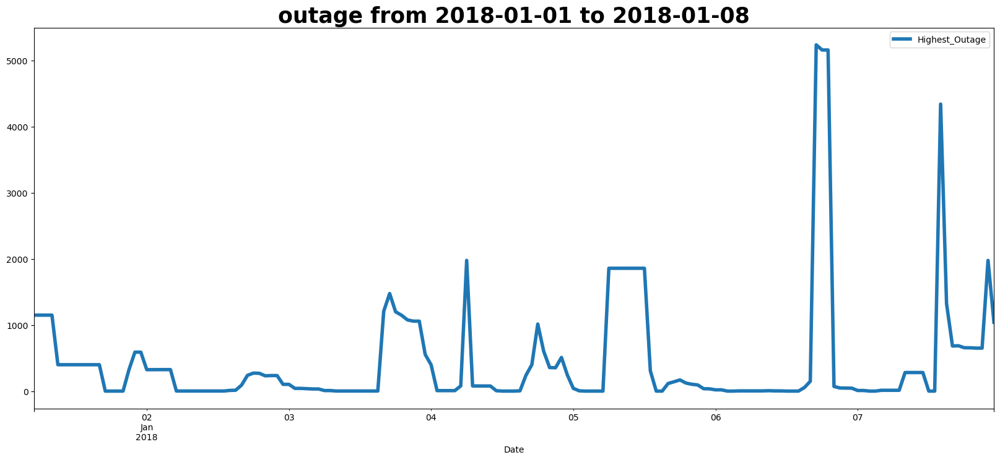

In [118]:
df_2018 = df_final[(df_final.index >= '2018-01-01') & (df_final.index < '2018-01-08')]

df_2018.plot(figsize=(20,8), lw=4)
plt.title('outage from 2018-01-01 to 2018-01-08', weight='bold', fontsize=25)

In [119]:
df = df_final.sort_index()

In [120]:
df

,Highest_Outage
Date,
2014-11-01 06:00:00,377.0
2014-11-01 07:00:00,0.0
2014-11-01 08:00:00,0.0
2014-11-01 09:00:00,0.0
2014-11-01 10:00:00,0.0
...,...
2022-11-12 14:00:00,0.0
2022-11-12 15:00:00,22.0
2022-11-12 16:00:00,25.0


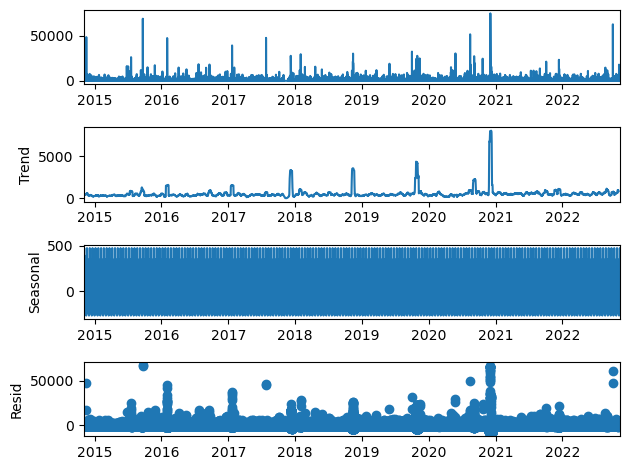

In [121]:
seasonal_decompose(df, period=365).plot()
plt.show()

In [122]:
# Daily Consumption
ma = df.resample('D').mean()

# 3 Day Example
ma['Moving Average'] = ma['Highest_Outage'].rolling(3).mean()
ma.head()

,Highest_Outage,Moving Average
Date,,
2014-11-01,1132.277778,NaN
2014-11-02,81.583333,NaN
2014-11-03,65.708333,426.523148
2014-11-04,110.041667,85.777778
2014-11-05,117.666667,97.805556


In [123]:
ma

,Highest_Outage,Moving Average
Date,,
2014-11-01,1132.277778,NaN
2014-11-02,81.583333,NaN
2014-11-03,65.708333,426.523148
2014-11-04,110.041667,85.777778
2014-11-05,117.666667,97.805556
...,...,...
2022-11-08,841.750000,2448.069444
2022-11-09,315.125000,2444.069444
2022-11-10,124.000000,426.958333


In [124]:
def moving_average(data, window):
    data['Moving Average'] = data['Highest_Outage'].rolling(window).mean()
    actual = data['Highest_Outage'][-(window+30):]
    ma = data['Moving Average'][-(window+30):]
    
    plt.figure(figsize=(20,8))
    actual.plot(label='Actual', lw=4)
    ma.plot(label='MA-{}'.format(str(window)), ls='--', lw=2)
    plt.title('{}-Days Moving Average'.format(str(window)), weight='bold', fontsize=25)
    plt.legend()

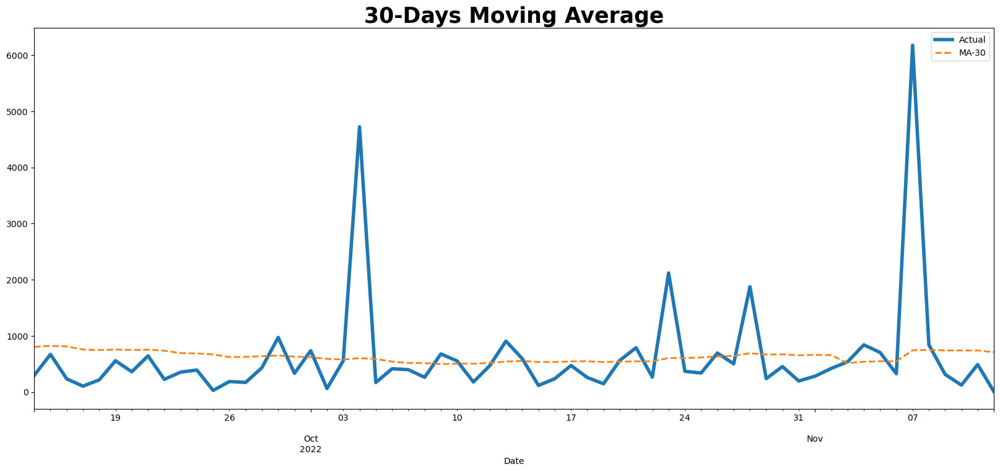

In [125]:
moving_average(ma, 30)

In [126]:
# Before building and training our model, let's split the data into training and testing
df_train, df_test = df[df.index < '2016-01-01'], df[df.index >= '2016-01-01']

print('Train:\t', len(df_train))
print('Test:\t', len(df_test))

Train:	 10167
Test:	 60014


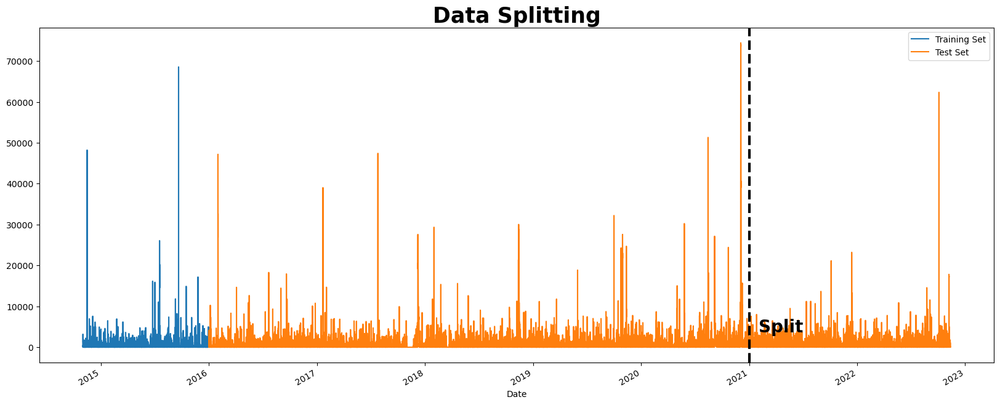

In [127]:
plt.figure(figsize=(20,8))

df_train['Highest_Outage'].plot(label='Training Set')
df_test['Highest_Outage'].plot(label='Test Set')
plt.axvline('2021-01-01', color='black', ls='--', lw=3)
plt.text('2021-02-01', 3700, 'Split', fontsize=20, fontweight='bold')
plt.title('Data Splitting', weight='bold', fontsize=25)
plt.legend()

In [128]:
def index_to_column(data):
    data = data.reset_index()
    data['Date'] = pd.to_datetime(data['Date'])
    data = data.sort_values('Date')
    data=data.rename(columns={'Date':'ds','Highest_Outage': 'y'})
    return data

In [129]:
prophet_train = index_to_column(df_train)
prophet_test = index_to_column(df_test)

In [130]:
prophet_model = Prophet(interval_width=0.95)

prophet_model.fit(prophet_train)
prophet_pred = prophet_model.predict(prophet_test[['ds']]) # Keep the dataset format

16:46:07 - cmdstanpy - INFO - Chain [1] start processing
16:46:09 - cmdstanpy - INFO - Chain [1] done processing


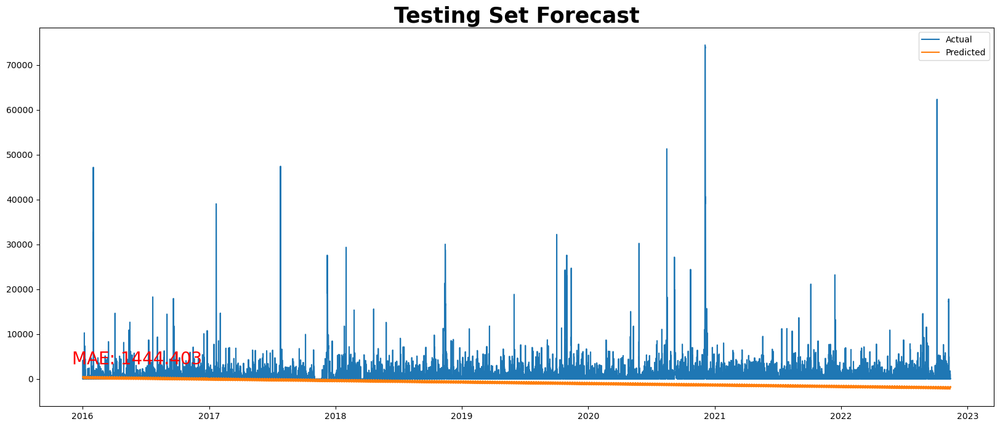

In [131]:
mae = round(mean_absolute_error(prophet_test['y'], prophet_pred['yhat']), 3)

plt.figure(figsize=(20,8))
plt.plot(prophet_test['ds'], prophet_test['y'], label='Actual')
plt.plot(prophet_pred['ds'], prophet_pred['yhat'], label='Predicted')
plt.title('Test Forecasting', weight='bold', fontsize=40)
plt.text(16770, 3250, 'MAE: {}'.format(mae), fontsize=20, color='red')
plt.title('Testing Set Forecast', weight='bold', fontsize=25)
plt.legend()

In [132]:
# This time, we will use all data (train and test) to train our model
new_df = index_to_column(df)

In [133]:
prophet_model2 = Prophet(interval_width=0.95)
prophet_model2.fit(new_df)
# 7 days to the future (7x24 = 168)
future_dates = prophet_model2.make_future_dataframe(periods=168, freq='H')
prophet_pred2 = prophet_model2.predict(future_dates)

16:46:34 - cmdstanpy - INFO - Chain [1] start processing
16:46:54 - cmdstanpy - INFO - Chain [1] done processing


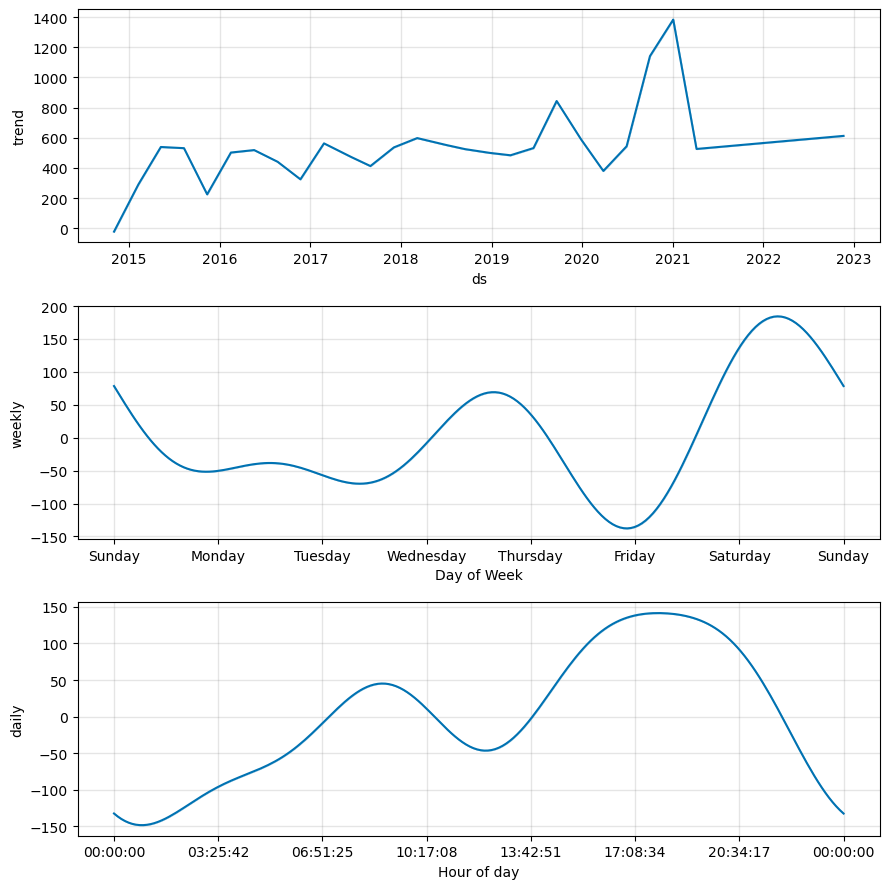

In [134]:
prophet_model.plot_components(prophet_pred2)
plt.show()

<Figure size 2000x800 with 0 Axes>

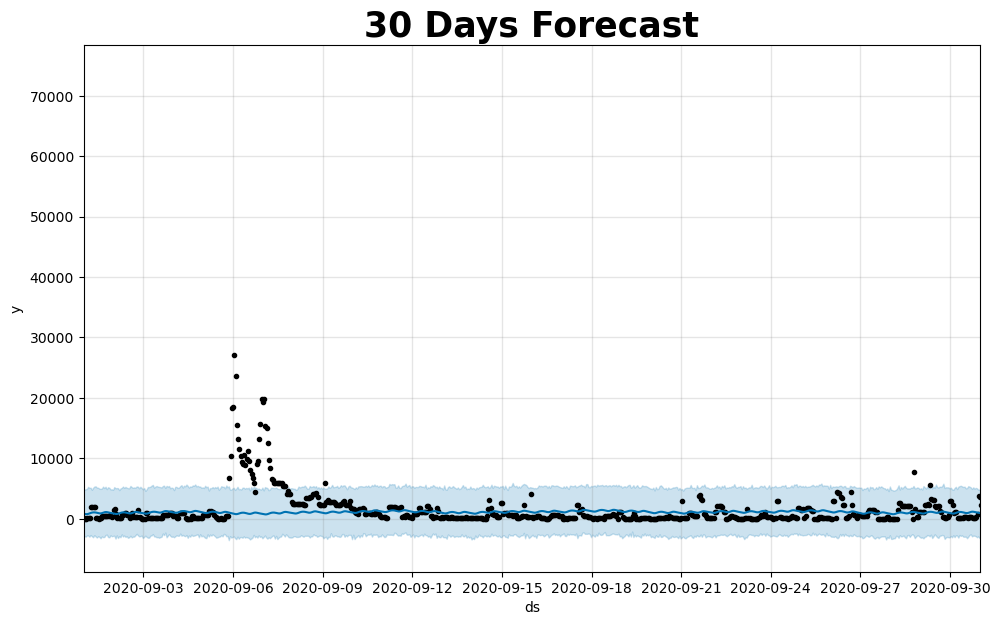

In [135]:
future_dates2 = prophet_model2.make_future_dataframe(periods=720, freq='H')
prophet_pred3 = prophet_model2.predict(future_dates2)

plt.figure(figsize=(20,8))

fig = prophet_model2.plot(prophet_pred3, uncertainty=True)
ax = fig.gca()
ax.set_xlim(pd.to_datetime(['2020-09-01', '2020-10-01']))
plt.title('30 Days Forecast', weight='bold', fontsize=25)
plt.show()

In [136]:
df

,Highest_Outage
Date,
2014-11-01 06:00:00,377.0
2014-11-01 07:00:00,0.0
2014-11-01 08:00:00,0.0
2014-11-01 09:00:00,0.0
2014-11-01 10:00:00,0.0
...,...
2022-11-12 14:00:00,0.0
2022-11-12 15:00:00,22.0
2022-11-12 16:00:00,25.0


In [137]:
df.shape

(70181, 1)

In [139]:
df['date'] = df.index
df['hour'] = df['date'].dt.hour
df['day_of_week'] = df['date'].dt.dayofweek
df['weekday_name'] = df['date'].dt.day_name()
df['quarter'] = df['date'].dt.quarter
df['month'] = df['date'].dt.month
df['year'] = df['date'].dt.year
df['day_of_year'] = df['date'].dt.dayofyear
df['day_of_month'] = df['date'].dt.day
df['week_of_year'] = df['date'].dt.weekofyear

df.head()

C:\Users\halee\AppData\Local\Temp\ipykernel_328\1400370480.py:10: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.



,Highest_Outage,date,hour,day_of_week,weekday_name,quarter,month,year,day_of_year,day_of_month,week_of_year
Date,,,,,,,,,,,
2014-11-01 06:00:00,377.0,2014-11-01 06:00:00,6,5,Saturday,4,11,2014,305,1,44
2014-11-01 07:00:00,0.0,2014-11-01 07:00:00,7,5,Saturday,4,11,2014,305,1,44
2014-11-01 08:00:00,0.0,2014-11-01 08:00:00,8,5,Saturday,4,11,2014,305,1,44
2014-11-01 09:00:00,0.0,2014-11-01 09:00:00,9,5,Saturday,4,11,2014,305,1,44
2014-11-01 10:00:00,0.0,2014-11-01 10:00:00,10,5,Saturday,4,11,2014,305,1,44


In [140]:
df_new = df[['Highest_Outage']].reset_index().rename(columns={'Date':'ds', 'Highest_Outage':'y'})
df_new.head()

,ds,y
0,2014-11-01 06:00:00,377.0
1,2014-11-01 07:00:00,0.0
2,2014-11-01 08:00:00,0.0
3,2014-11-01 09:00:00,0.0
4,2014-11-01 10:00:00,0.0


In [141]:
train_len = math.floor((df_new.shape[0]*90)/100)
train_len

63162

In [142]:
train = df_new[:train_len]
test = df_new[train_len:]

In [143]:
train.tail()

,ds,y
63157,2022-01-24 03:00:00,0.0
63158,2022-01-24 04:00:00,19.0
63159,2022-01-24 05:00:00,718.0
63160,2022-01-24 06:00:00,807.0
63161,2022-01-24 07:00:00,807.0


In [144]:
test.head()

,ds,y
63162,2022-01-24 08:00:00,807.0
63163,2022-01-24 09:00:00,807.0
63164,2022-01-24 10:00:00,807.0
63165,2022-01-24 11:00:00,807.0
63166,2022-01-24 12:00:00,807.0


In [145]:
train_samples = go.Scatter(x = train['ds'],
                  y = train['y'],
                  mode = 'lines',
                  name = 'Train')

test_samples = go.Scatter(x = test['ds'],
                  y = test['y'],
                  mode = 'lines',
                  name = 'Test')

layout = go.Layout(title={'text': 'Train/test split',
                          'y':0.9,
                          'x':0.5,
                          'xanchor': 'center',
                          'yanchor': 'top'},
                   xaxis = dict(title = 'Year'),
                   yaxis = dict(title = 'Highest_Outage'),
                   template = 'plotly_dark')

data = [train_samples, test_samples]
fig = go.Figure(data = data, layout = layout)
iplot(fig)

In [146]:
prophet_model = Prophet()
prophet_model.fit(train)

17:02:03 - cmdstanpy - INFO - Chain [1] start processing
17:02:17 - cmdstanpy - INFO - Chain [1] done processing


In [147]:
test_forecast = prophet_model.predict(test)
test_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2022-01-24 08:00:00,550.676174,-2041.678293,3320.716729
1,2022-01-24 09:00:00,547.640696,-2298.268857,3189.530456
2,2022-01-24 10:00:00,520.637094,-2155.985776,3296.172922
3,2022-01-24 11:00:00,478.060699,-2354.639137,2996.379247
4,2022-01-24 12:00:00,434.747990,-2091.288126,3119.493127


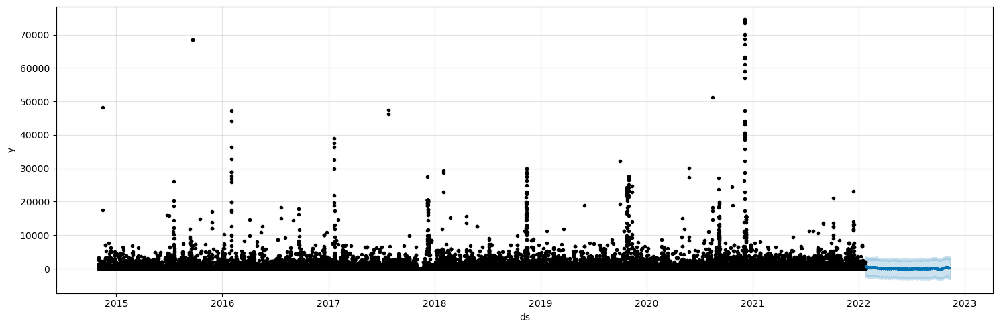

In [148]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = prophet_model.plot(test_forecast,ax=ax)
plt.show()

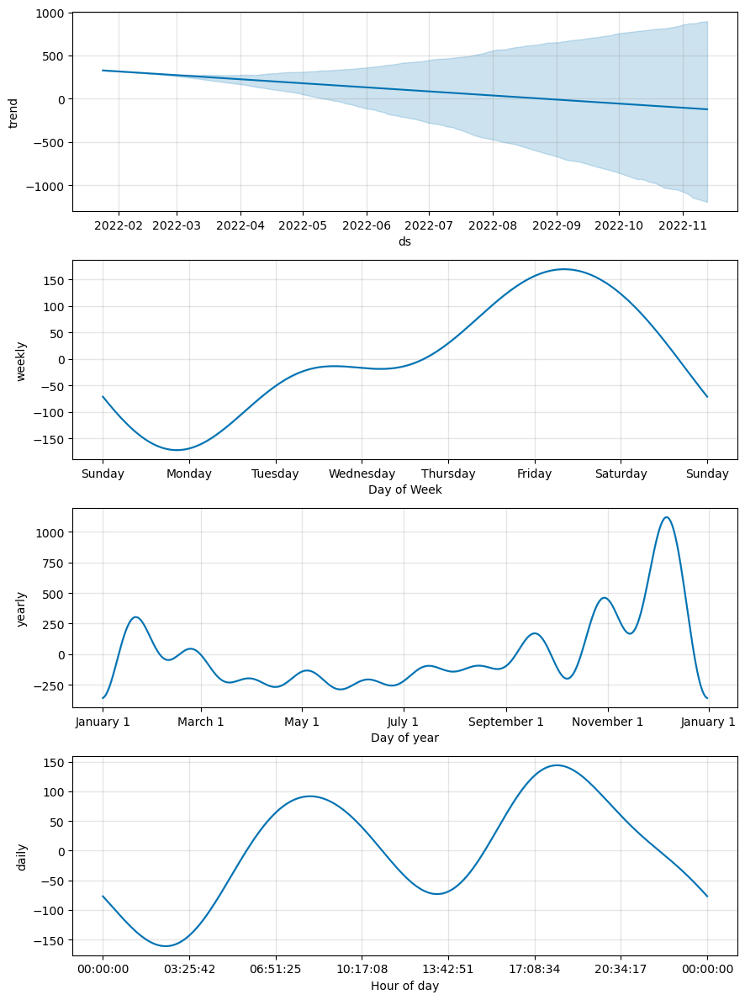

In [149]:
prophet_model.plot_components(test_forecast)
plt.show()

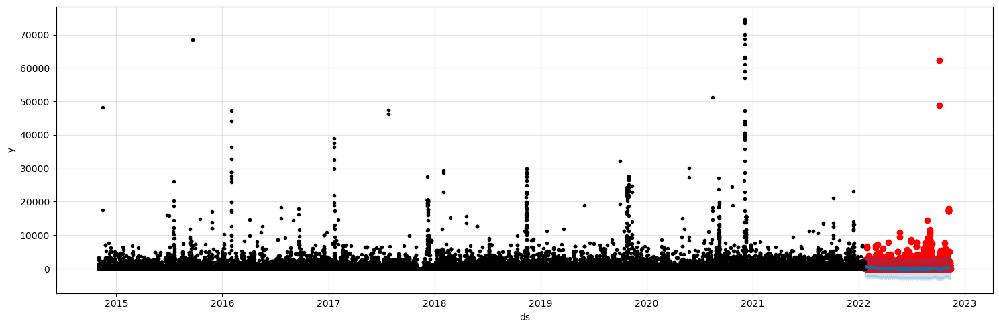

In [150]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(test.ds, test['y'], color='r')
fig = prophet_model.plot(test_forecast, ax=ax)

In [151]:
future = prophet_model.make_future_dataframe(periods=500, freq='D')
forecast_future = prophet_model.predict(future)
forecast_future[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2014-11-01 06:00:00,399.883673,-2175.134095,3023.466784
1,2014-11-01 07:00:00,442.203239,-2336.995255,3314.695108
2,2014-11-01 08:00:00,455.659048,-2105.804047,3194.139156
3,2014-11-01 09:00:00,440.011598,-2197.105372,3385.787182
4,2014-11-01 10:00:00,399.954488,-2483.193452,3095.279648


In [152]:
forecast_future[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
63657,2023-06-04 07:00:00,-721.063562,-4251.271471,2743.035344
63658,2023-06-05 07:00:00,-737.263699,-4432.474917,2630.063020
63659,2023-06-06 07:00:00,-612.341979,-4038.151142,2959.847227
63660,2023-06-07 07:00:00,-603.191717,-4293.914454,3231.585636
63661,2023-06-08 07:00:00,-513.233532,-3915.131399,3089.951686


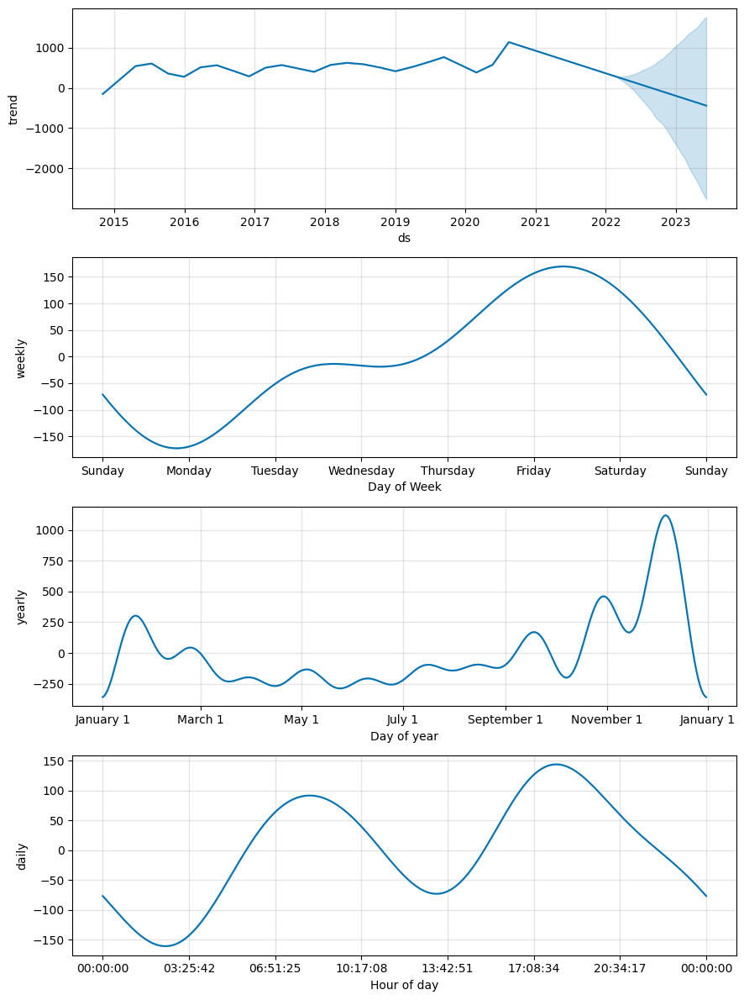

In [153]:
prophet_model.plot_components(forecast_future)
plt.show()

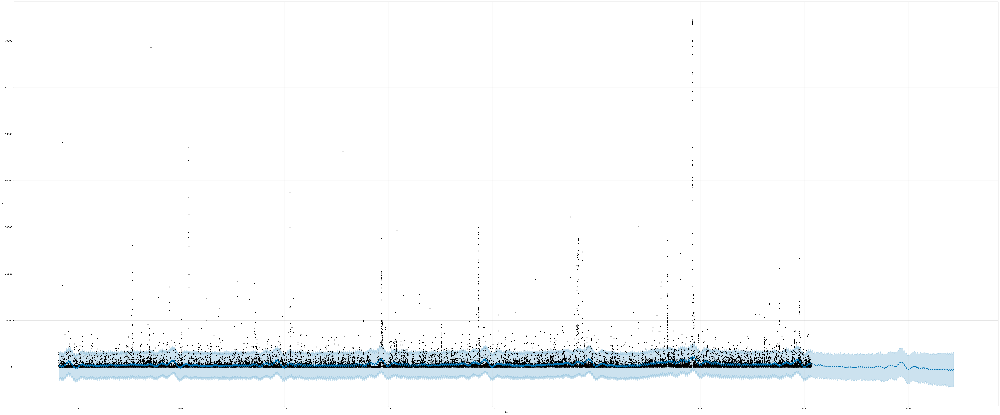

In [154]:
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(60)
fig = prophet_model.plot(forecast_future,ax=ax)
plt.show()

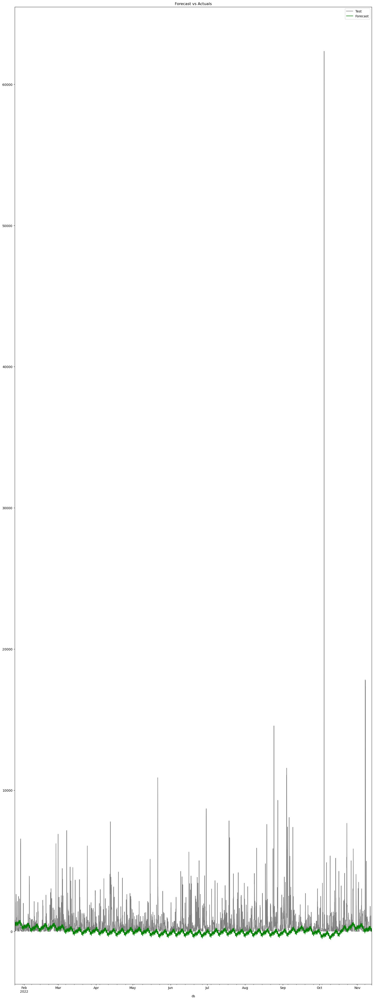

In [155]:
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(55)
f.set_figwidth(20)
test.plot(kind='line',x='ds', y='y', color='gray', label='Test', ax=ax)
test_forecast.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('Forecast vs Actuals')
plt.show()

In [159]:
import pandas as pd
import math
import numpy as np

# ---------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
import pylab 
plt.rcParams['figure.figsize']=(17,5)

# ---------------------------------------
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import iplot
import holidays
from sklearn.metrics import mean_squared_error, mean_absolute_error

import warnings
warnings.filterwarnings("ignore")

In [160]:
mape = MAPE(test['y'],test_forecast['yhat'])
print("MAPE",round(mape,4))

NameError: name 'MAPE' is not defined

In [161]:
df

,Highest_Outage,date,hour,day_of_week,weekday_name,quarter,month,year,day_of_year,day_of_month,week_of_year
Date,,,,,,,,,,,
2014-11-01 06:00:00,377.0,2014-11-01 06:00:00,6,5,Saturday,4,11,2014,305,1,44
2014-11-01 07:00:00,0.0,2014-11-01 07:00:00,7,5,Saturday,4,11,2014,305,1,44
2014-11-01 08:00:00,0.0,2014-11-01 08:00:00,8,5,Saturday,4,11,2014,305,1,44
2014-11-01 09:00:00,0.0,2014-11-01 09:00:00,9,5,Saturday,4,11,2014,305,1,44
2014-11-01 10:00:00,0.0,2014-11-01 10:00:00,10,5,Saturday,4,11,2014,305,1,44
...,...,...,...,...,...,...,...,...,...,...,...
2022-11-12 14:00:00,0.0,2022-11-12 14:00:00,14,5,Saturday,4,11,2022,316,12,45
2022-11-12 15:00:00,22.0,2022-11-12 15:00:00,15,5,Saturday,4,11,2022,316,12,45
2022-11-12 16:00:00,25.0,2022-11-12 16:00:00,16,5,Saturday,4,11,2022,316,12,45


In [162]:
df_final

,Highest_Outage
Date,
2014-11-01 06:00:00,377.0
2014-11-01 07:00:00,0.0
2014-11-01 08:00:00,0.0
2014-11-01 09:00:00,0.0
2014-11-01 10:00:00,0.0
...,...
2022-11-12 14:00:00,0.0
2022-11-12 15:00:00,22.0
2022-11-12 16:00:00,25.0


In [163]:
holiday = pd.DataFrame([])
for date, name in sorted(holidays.UnitedStates(years=[2014, 
                                                      2015, 2016, 2017, 2018,2019,2020,2021,2022]).items()):
    holiday = holiday.append(pd.DataFrame({'ds': date, 'holiday': "US-Holidays"}, index=[0]), ignore_index=True)
holiday['ds'] = pd.to_datetime(holiday['ds'], format='%Y-%m-%d', errors='ignore')

In [164]:
holiday.head()

,ds,holiday
0,2014-01-01,US-Holidays
1,2014-01-20,US-Holidays
2,2014-02-17,US-Holidays
3,2014-05-26,US-Holidays
4,2014-07-04,US-Holidays


In [165]:
prophet_model_with_holidays = Prophet(holidays=holiday)
prophet_model_with_holidays.fit(train)

17:12:52 - cmdstanpy - INFO - Chain [1] start processing
17:13:09 - cmdstanpy - INFO - Chain [1] done processing


In [166]:
future = prophet_model_with_holidays.make_future_dataframe(periods=500, freq='D')
forecast = prophet_model_with_holidays.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
63657,2023-06-04 07:00:00,-826.761091,-5554.003343,3469.659946
63658,2023-06-05 07:00:00,-841.201502,-5427.078453,3348.915679
63659,2023-06-06 07:00:00,-718.017653,-4942.362636,3563.188971
63660,2023-06-07 07:00:00,-710.054365,-5138.012254,3378.465803
63661,2023-06-08 07:00:00,-619.679498,-5184.839307,3493.623966


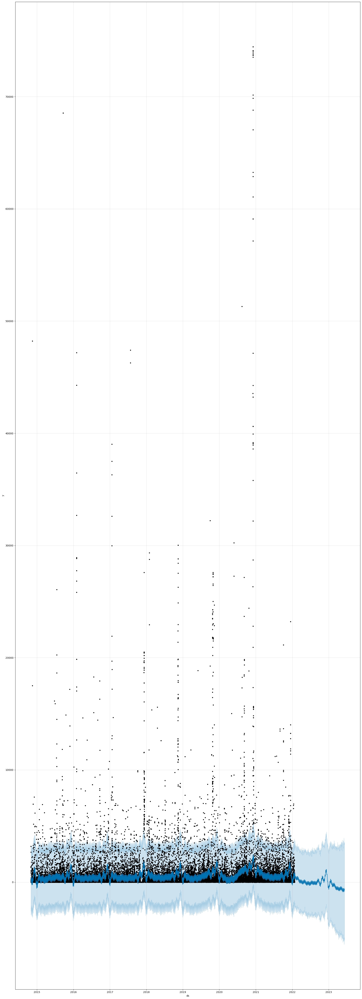

In [167]:
f, ax = plt.subplots(1)
f.set_figheight(55)
f.set_figwidth(20)
fig = prophet_model_with_holidays.plot(forecast,ax=ax)
plt.show()

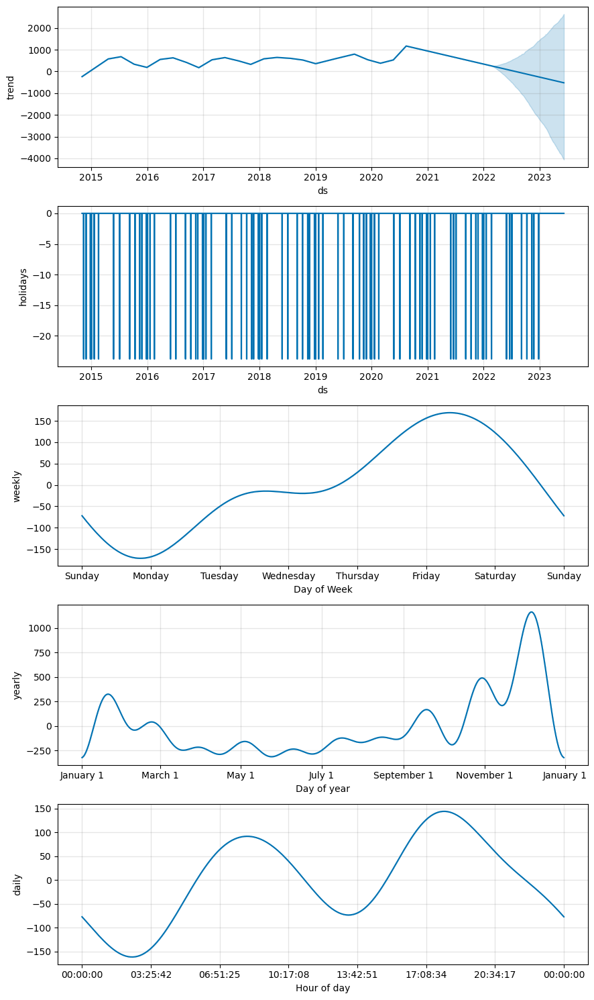

In [168]:
fig = prophet_model_with_holidays.plot_components(forecast)

In [169]:
test_forecast_holiday = prophet_model_with_holidays.predict(test)
test_forecast_holiday[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
7014,2022-11-12 14:00:00,-3.172157,-3281.595807,2988.722099
7015,2022-11-12 15:00:00,37.904101,-3156.981157,3163.411788
7016,2022-11-12 16:00:00,99.901577,-2970.952248,3239.059138
7017,2022-11-12 17:00:00,150.527855,-3126.865710,3135.568014
7018,2022-11-12 18:00:00,164.199332,-2873.638978,3471.923438


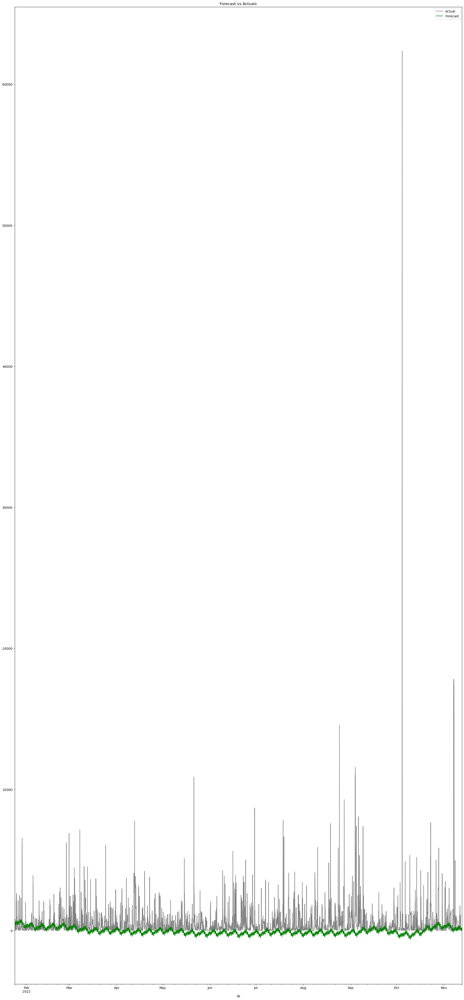

In [170]:
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(55)
f.set_figwidth(25)
test.plot(kind='line',x='ds', y='y', color='gray', label='Actual', ax=ax)
test_forecast_holiday.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('Forecast vs Actuals')
plt.show()

In [171]:
mape = MAPE(test['y'],test_forecast_holiday['yhat'])
print("MAPE",round(mape,4))

NameError: name 'MAPE' is not defined

In [172]:
df

,Highest_Outage,date,hour,day_of_week,weekday_name,quarter,month,year,day_of_year,day_of_month,week_of_year
Date,,,,,,,,,,,
2014-11-01 06:00:00,377.0,2014-11-01 06:00:00,6,5,Saturday,4,11,2014,305,1,44
2014-11-01 07:00:00,0.0,2014-11-01 07:00:00,7,5,Saturday,4,11,2014,305,1,44
2014-11-01 08:00:00,0.0,2014-11-01 08:00:00,8,5,Saturday,4,11,2014,305,1,44
2014-11-01 09:00:00,0.0,2014-11-01 09:00:00,9,5,Saturday,4,11,2014,305,1,44
2014-11-01 10:00:00,0.0,2014-11-01 10:00:00,10,5,Saturday,4,11,2014,305,1,44
...,...,...,...,...,...,...,...,...,...,...,...
2022-11-12 14:00:00,0.0,2022-11-12 14:00:00,14,5,Saturday,4,11,2022,316,12,45
2022-11-12 15:00:00,22.0,2022-11-12 15:00:00,15,5,Saturday,4,11,2022,316,12,45
2022-11-12 16:00:00,25.0,2022-11-12 16:00:00,16,5,Saturday,4,11,2022,316,12,45


In [173]:
df_final

,Highest_Outage
Date,
2014-11-01 06:00:00,377.0
2014-11-01 07:00:00,0.0
2014-11-01 08:00:00,0.0
2014-11-01 09:00:00,0.0
2014-11-01 10:00:00,0.0
...,...
2022-11-12 14:00:00,0.0
2022-11-12 15:00:00,22.0
2022-11-12 16:00:00,25.0


In [174]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime 

In [175]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xg


from sklearn.metrics import mean_squared_error

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [176]:
df_final

,Highest_Outage
Date,
2014-11-01 06:00:00,377.0
2014-11-01 07:00:00,0.0
2014-11-01 08:00:00,0.0
2014-11-01 09:00:00,0.0
2014-11-01 10:00:00,0.0
...,...
2022-11-12 14:00:00,0.0
2022-11-12 15:00:00,22.0
2022-11-12 16:00:00,25.0


In [177]:
df1=df_final

<Axes: title={'center': ' Hourly Power outage in san diego'}, xlabel='Date'>

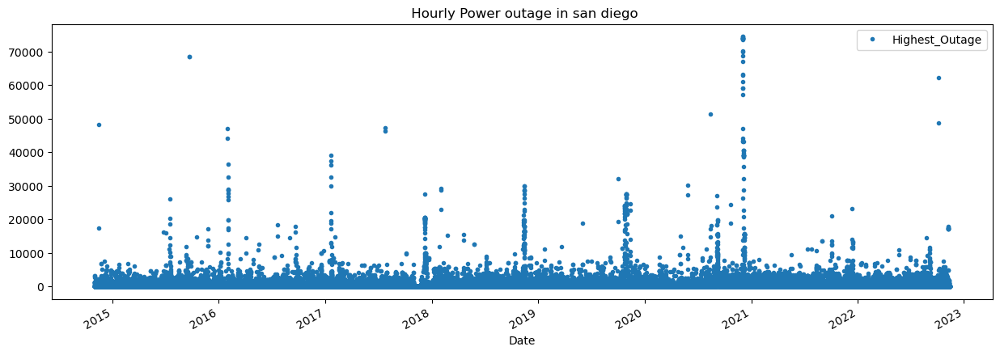

In [178]:
df1.plot(style=".", figsize=(15,5), title=" Hourly Power outage in san diego")

In [179]:
train = df.loc[df.index < '06-01-2021']
test = df.loc[df.index >= '06-01-2021']

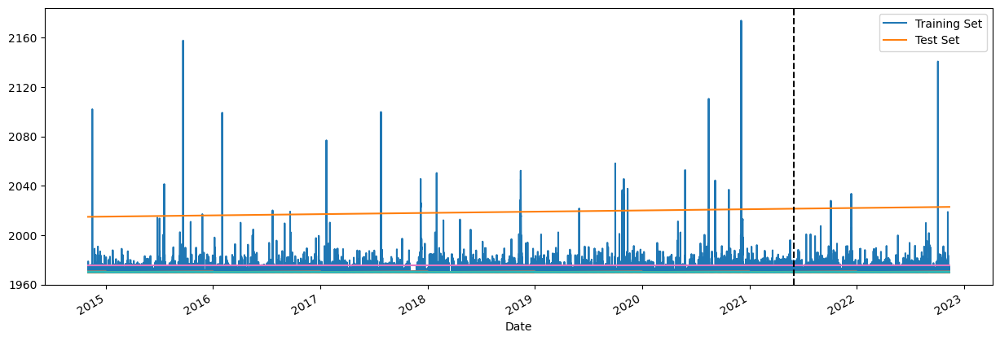

In [180]:
fig, ax = plt.subplots(figsize=(15,5))
train.plot(ax=ax, label="Train")
test.plot(ax=ax, label="Test")

ax.axvline('06-01-2021',color="black",ls="--")
ax.legend(['Training Set','Test Set'])
plt.show()

<Axes: xlabel='Date'>

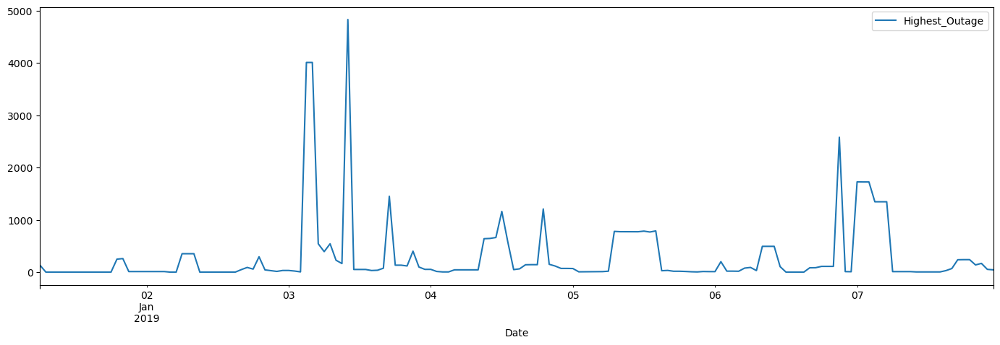

In [181]:
df1.loc[(df1.index > '01-01-2019') & (df1.index < '01-08-2019')].plot()

In [182]:
def create_time_series_features(dataframe):
    df1 = dataframe.copy()
    df1['hour'] = df1.index.hour
    df1['dayofweek'] = df1.index.dayofweek
    df1['quarter'] = df1.index.quarter
    df1['month'] = df1.index.month
    df1['year'] = df1.index.year
    df1['dayofyear'] = df1.index.dayofyear
    
    return df1

In [183]:
df1 = create_time_series_features(df1)

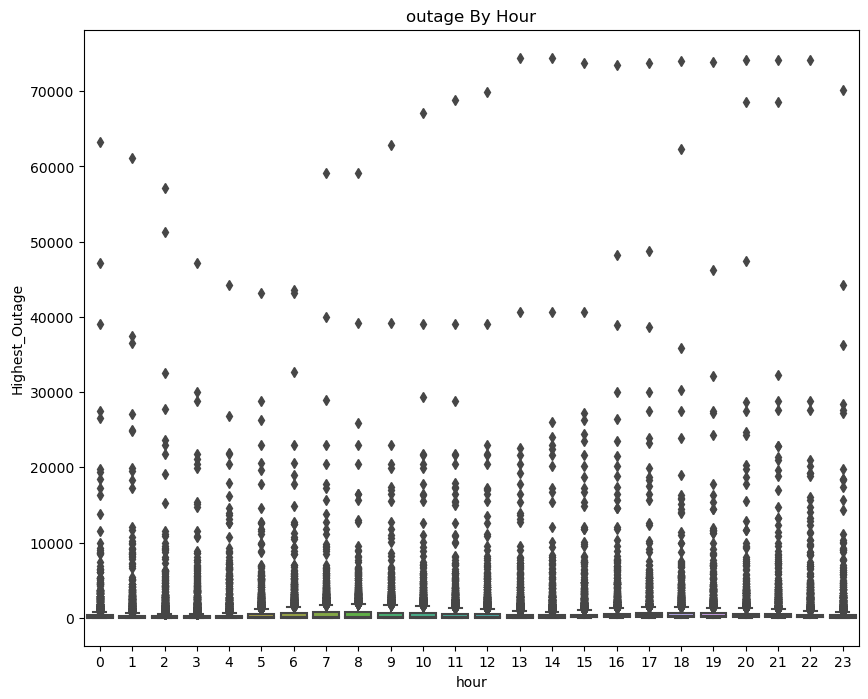

In [185]:
fig, ax = plt.subplots(figsize=(10,8))
sns.boxplot(data=df1, x="hour",y="Highest_Outage")
ax.set_title("outage By Hour")
plt.show()

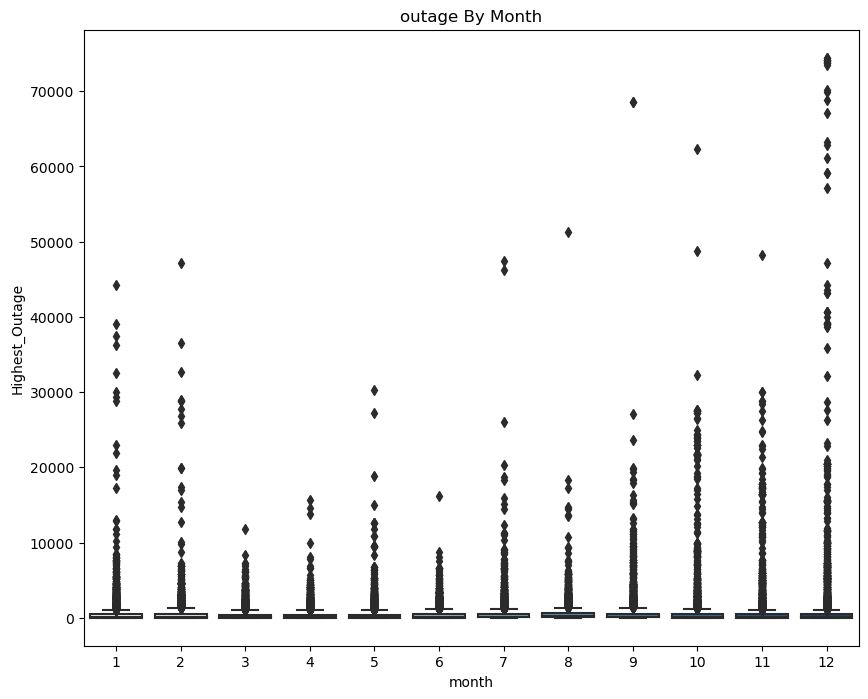

In [186]:
fig, ax = plt.subplots(figsize=(10,8))
sns.boxplot(data=df1, x="month",y="Highest_Outage",palette="Blues")
ax.set_title("outage By Month")
plt.show()

In [187]:
df1.columns

Index(['Highest_Outage', 'hour', 'dayofweek', 'quarter', 'month', 'year',
       'dayofyear'],
      dtype='object')

In [188]:
FEATURES = ['hour', 'dayofweek', 'quarter', 'month', 'year',
       'dayofyear']

OUTPUT = ['Highest_Outage']

In [189]:
train = create_time_series_features(train)
test = create_time_series_features(test)

In [190]:
X_train = train[FEATURES]
y_train = train[OUTPUT]

X_test = test[FEATURES]
y_test = test[OUTPUT]

In [191]:
reg = xg.XGBRegressor(n_estimators=1000,early_stopping_rounds=50, learning_rate=0.01)
reg.fit(
    X_train, 
    y_train, 
    eval_set=[(X_train, y_train),(X_test, y_test)],
    verbose=100
)

[0]	validation_0-rmse:2294.04431	validation_1-rmse:1448.91973
[54]	validation_0-rmse:1822.05176	validation_1-rmse:1746.20060


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [192]:
f1 = pd.DataFrame(data=reg.feature_importances_, index=reg.feature_names_in_, columns=['importance'])

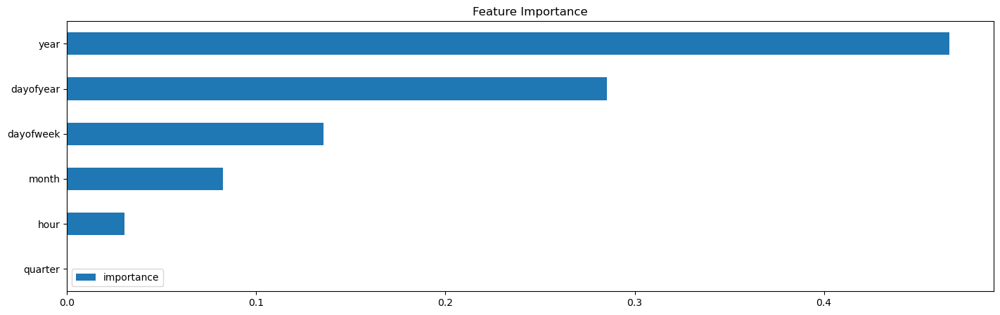

In [193]:
f1.sort_values('importance').plot(kind="barh",title="Feature Importance")
plt.show()

In [194]:
test['predictions'] = reg.predict(X_test)

In [195]:
df1 = df1.merge(test[['predictions']], how='left',left_index=True, right_index=True)

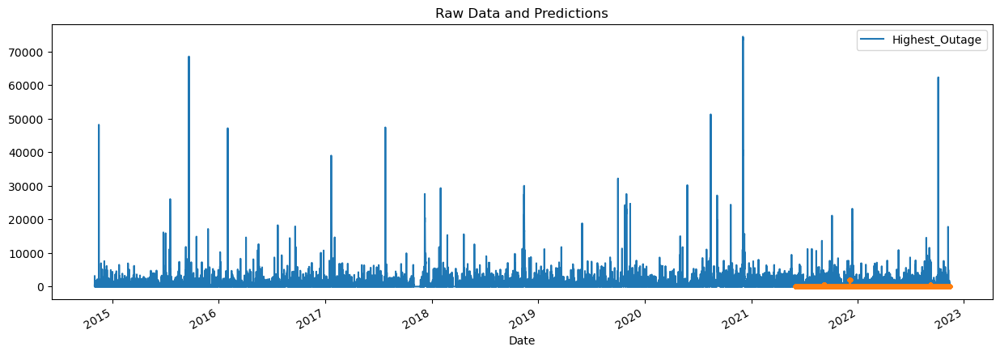

In [197]:
ax = df1[['Highest_Outage']].plot(figsize=(15,5))
df1['predictions'].plot(ax=ax, style=".")
ax.set_title("Raw Data and Predictions")
plt.show()

In [200]:
score = np.sqrt(mean_squared_error(test['Highest_Outage'],test['predictions']))
print(f'RMSE SCORE: {score}')

RMSE SCORE: 1445.33617372561


<Axes: ylabel='Frequency'>

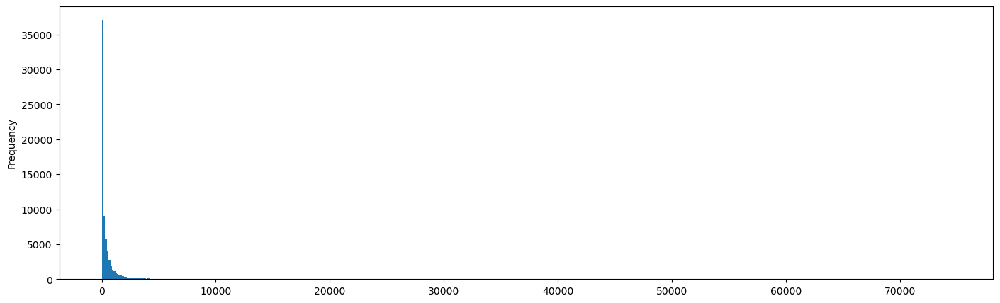

In [201]:
df['Highest_Outage'].plot(kind="hist",bins=500)

In [202]:
df1 = df1.query('Highest_Outage > 100').copy()

In [203]:
from sklearn.model_selection import TimeSeriesSplit

In [204]:
tss = TimeSeriesSplit(n_splits=5, test_size=24*365*1,gap=24)
df1 = df1.sort_index()

In [205]:
df1 = create_time_series_features(df1)

In [207]:
target_map = df1['Highest_Outage'].to_dict()

In [208]:
def add_lags(dframe):
    df1 = dframe.copy()
    df1['lag1'] = (df1.index - pd.Timedelta('364 days')).map(target_map)
    df1['lag2'] = (df1.index - pd.Timedelta('728 days')).map(target_map)
    df1['lag3'] = (df1.index - pd.Timedelta('1092 days')).map(target_map)
    
    return df1

In [209]:
df1 = add_lags(df1)

In [210]:
 df1.tail()

,Highest_Outage,hour,dayofweek,quarter,month,year,dayofyear,predictions,lag1,lag2,lag3
Date,,,,,,,,,,,
2022-11-11 13:00:00,1663.0,13,4,4,11,2022,315,28.036139,NaN,NaN,NaN
2022-11-11 20:00:00,1110.0,20,4,4,11,2022,315,31.953213,629.0,431.0,451.0
2022-11-11 21:00:00,1108.0,21,4,4,11,2022,315,31.953213,565.0,407.0,441.0
2022-11-11 22:00:00,193.0,22,4,4,11,2022,315,31.953213,448.0,276.0,101.0
2022-11-11 23:00:00,193.0,23,4,4,11,2022,315,31.953213,370.0,270.0,NaN


In [211]:
tss = TimeSeriesSplit(n_splits=5, test_size=24*365*1,gap=24)
df1 = df1.sort_index()

In [212]:
df1.columns

Index(['Highest_Outage', 'hour', 'dayofweek', 'quarter', 'month', 'year',
       'dayofyear', 'predictions', 'lag1', 'lag2', 'lag3'],
      dtype='object')

In [213]:
fold = 0
preds = []
scores = []

for train_idx, val_idx in tss.split(df):
    train = df.iloc[train_idx]
    test = df.iloc[val_idx]
    
    train = create_time_series_features(train)
    test = create_time_series_features(test)
    
    FEATURES = ['hour', 'dayofweek', 'quarter', 'month', 'year', 'dayofyear',
       'lag1', 'lag2', 'lag3']

    OUTPUT = 'Highest_Outage'
    
    X_train = train[FEATURES]
    y_train = train[OUTPUT]
    
    X_test = test[FEATURES]
    y_test = test[OUTPUT]
    
    reg = xg.XGBRegressor(
        base_score=0.5,
        booster='gbtree',
        n_estimators=1000,
        early_stopping_rounds=50,
        objective='reg:linear',
        max_depth=3,
        learning_rate=0.01
    )
    
    reg.fit(
        X_train, 
        y_train,
        eval_set=[(X_train, y_train),(X_test, y_test)],
        verbose=100
    )
    
    y_pred = reg.predict(X_test)
    preds.append(y_pred)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)

KeyError: "['lag1', 'lag2', 'lag3'] not in index"

In [214]:
# Sort the DataFrame by the "run_start_time" column in ascending order
df1.sort_values(by='run_start_time', inplace=True)

# Adding the lag columns
df1['lag1'] = df1['hourly_sum'].shift(1)
df1['lag2'] = df1['hourly_sum'].shift(2)
df1['lag3'] = df1['hourly_sum'].shift(3)

KeyError: 'run_start_time'

In [215]:
df1

,Highest_Outage,hour,dayofweek,quarter,month,year,dayofyear,predictions,lag1,lag2,lag3
Date,,,,,,,,,,,
2014-11-01 06:00:00,377.0,6,5,4,11,2014,305,NaN,NaN,NaN,NaN
2014-11-01 11:00:00,3191.0,11,5,4,11,2014,305,NaN,NaN,NaN,NaN
2014-11-01 12:00:00,3191.0,12,5,4,11,2014,305,NaN,NaN,NaN,NaN
2014-11-01 13:00:00,2677.0,13,5,4,11,2014,305,NaN,NaN,NaN,NaN
2014-11-01 14:00:00,925.0,14,5,4,11,2014,305,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2022-11-11 13:00:00,1663.0,13,4,4,11,2022,315,28.036139,NaN,NaN,NaN
2022-11-11 20:00:00,1110.0,20,4,4,11,2022,315,31.953213,629.0,431.0,451.0
2022-11-11 21:00:00,1108.0,21,4,4,11,2022,315,31.953213,565.0,407.0,441.0


In [217]:
df1 = df1.fillna(0)

# 

# 

In [219]:
df1

,Highest_Outage,hour,dayofweek,quarter,month,year,dayofyear,predictions,lag1,lag2,lag3
Date,,,,,,,,,,,
2014-11-01 06:00:00,377.0,6,5,4,11,2014,305,0.000000,0.0,0.0,0.0
2014-11-01 11:00:00,3191.0,11,5,4,11,2014,305,0.000000,0.0,0.0,0.0
2014-11-01 12:00:00,3191.0,12,5,4,11,2014,305,0.000000,0.0,0.0,0.0
2014-11-01 13:00:00,2677.0,13,5,4,11,2014,305,0.000000,0.0,0.0,0.0
2014-11-01 14:00:00,925.0,14,5,4,11,2014,305,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2022-11-11 13:00:00,1663.0,13,4,4,11,2022,315,28.036139,0.0,0.0,0.0
2022-11-11 20:00:00,1110.0,20,4,4,11,2022,315,31.953213,629.0,431.0,451.0
2022-11-11 21:00:00,1108.0,21,4,4,11,2022,315,31.953213,565.0,407.0,441.0


In [220]:
fold = 0
preds = []
scores = []

for train_idx, val_idx in tss.split(df):
    train = df.iloc[train_idx]
    test = df.iloc[val_idx]
    
    train = create_time_series_features(train)
    test = create_time_series_features(test)
    
    FEATURES = ['hour', 'dayofweek', 'quarter', 'month', 'year', 'dayofyear',
       'lag1', 'lag2', 'lag3']

    OUTPUT = 'hourly_sum'
    
    X_train = train[FEATURES]
    y_train = train[OUTPUT]
    
    X_test = test[FEATURES]
    y_test = test[OUTPUT]
    
    reg = xg.XGBRegressor(
        base_score=0.5,
        booster='gbtree',
        n_estimators=1000,
        early_stopping_rounds=50,
        objective='reg:linear',
        max_depth=3,
        learning_rate=0.01
    )
    
    reg.fit(
        X_train, 
        y_train,
        eval_set=[(X_train, y_train),(X_test, y_test)],
        verbose=100
    )
    
    y_pred = reg.predict(X_test)
    preds.append(y_pred)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)

KeyError: "['lag1', 'lag2', 'lag3'] not in index"

In [221]:
df_final

,Highest_Outage
Date,
2014-11-01 06:00:00,377.0
2014-11-01 07:00:00,0.0
2014-11-01 08:00:00,0.0
2014-11-01 09:00:00,0.0
2014-11-01 10:00:00,0.0
...,...
2022-11-12 14:00:00,0.0
2022-11-12 15:00:00,22.0
2022-11-12 16:00:00,25.0


In [223]:
# Convert run_start_time to datetime format
df_final['Date'] = pd.to_datetime(df_final['Date'])

# Set the run_start_time column as the DataFrame index
df_final.set_index('Date', inplace=True)

KeyError: 'Date'

Text(0.5, 1.0, 'outage from 2018-01-01 to 2018-01-08')

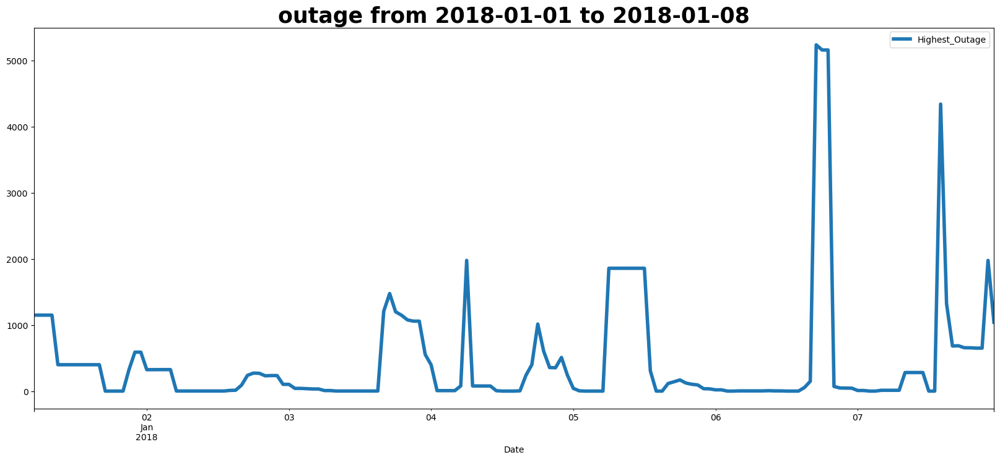

In [224]:
df_2018 = df_final[(df_final.index >= '2018-01-01') & (df_final.index < '2018-01-08')]

df_2018.plot(figsize=(20,8), lw=4)
plt.title('outage from 2018-01-01 to 2018-01-08', weight='bold', fontsize=25)

In [225]:
df = df_final.sort_index()

In [226]:
df.head()

,Highest_Outage
Date,
2014-11-01 06:00:00,377.0
2014-11-01 07:00:00,0.0
2014-11-01 08:00:00,0.0
2014-11-01 09:00:00,0.0
2014-11-01 10:00:00,0.0


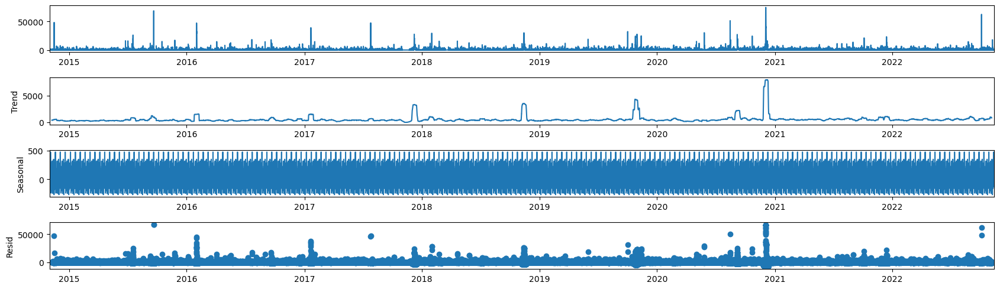

In [227]:
seasonal_decompose(df, period=365).plot()
plt.show()

In [229]:
# Daily Consumption
ma = df.resample('D').mean()

# 3 Day Example
ma['Moving Average'] = ma['Highest_Outage'].rolling(3).mean()
ma.head()

,Highest_Outage,Moving Average
Date,,
2014-11-01,1132.277778,NaN
2014-11-02,81.583333,NaN
2014-11-03,65.708333,426.523148
2014-11-04,110.041667,85.777778
2014-11-05,117.666667,97.805556


In [230]:
ma

,Highest_Outage,Moving Average
Date,,
2014-11-01,1132.277778,NaN
2014-11-02,81.583333,NaN
2014-11-03,65.708333,426.523148
2014-11-04,110.041667,85.777778
2014-11-05,117.666667,97.805556
...,...,...
2022-11-08,841.750000,2448.069444
2022-11-09,315.125000,2444.069444
2022-11-10,124.000000,426.958333


In [233]:
def moving_average(data, window):
    data['Moving Average'] = data['Highest_Outage'].rolling(window).mean()
    actual = data['Highest_Outage'][-(window+30):]
    ma = data['Moving Average'][-(window+30):]
    
    plt.figure(figsize=(20,8))
    actual.plot(label='Actual', lw=4)
    ma.plot(label='MA-{}'.format(str(window)), ls='--', lw=2)
    plt.title('{}-Days Moving Average'.format(str(window)), weight='bold', fontsize=25)
    plt.legend()

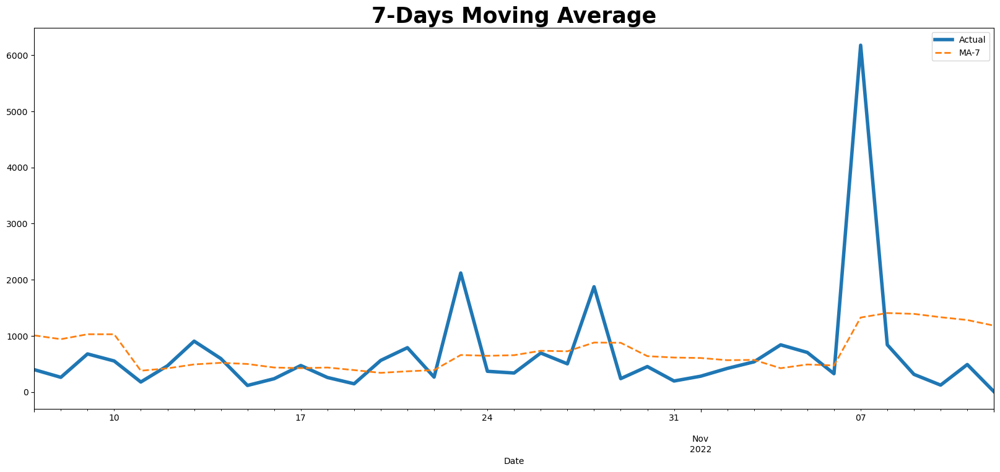

In [234]:
moving_average(ma, 7)

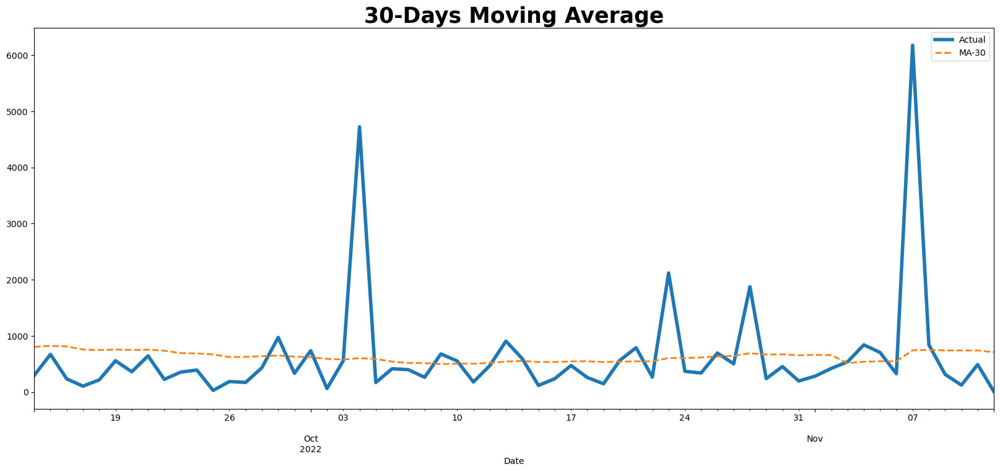

In [235]:
moving_average(ma, 30)

In [236]:
# Before building and training our model, let's split the data into training and testing
df_train, df_test = df[df.index < '2020-01-01'], df[df.index >= '2020-01-01']

print('Train:\t', len(df_train))
print('Test:\t', len(df_test))

Train:	 45104
Test:	 25077


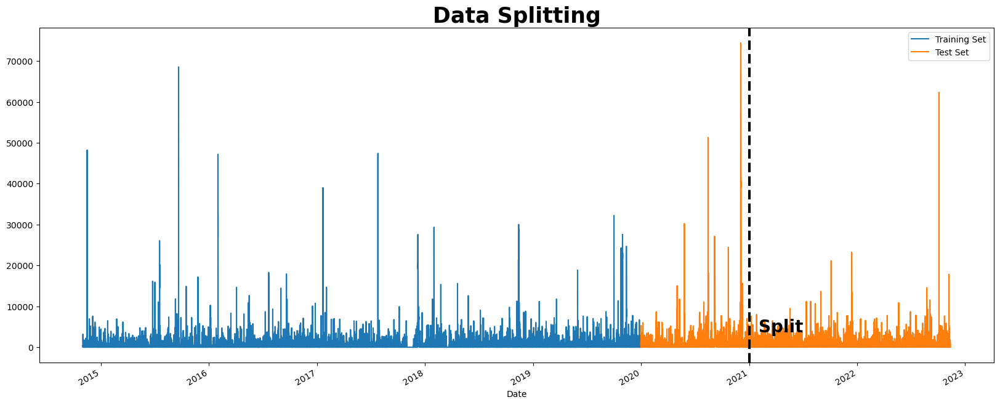

In [240]:
plt.figure(figsize=(20,8))

df_train['Highest_Outage'].plot(label='Training Set')
df_test['Highest_Outage'].plot(label='Test Set')
plt.axvline('2021-01-01', color='black', ls='--', lw=3)
plt.text('2021-02-01', 3700, 'Split', fontsize=20, fontweight='bold')
plt.title('Data Splitting', weight='bold', fontsize=25)
plt.legend()

In [241]:
#prophet model

In [244]:
def index_to_column(data):
    data = data.reset_index()
    data['Date'] = pd.to_datetime(data['Date'])
    data = data.sort_values('Date')
    data=data.rename(columns={'Date':'ds','Highest_Outage': 'y'})
    return data

In [245]:
prophet_train = index_to_column(df_train)
prophet_test = index_to_column(df_test)

In [246]:
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_absolute_error


from prophet import Prophet
from xgboost import XGBRegressor

In [247]:
prophet_model = Prophet(interval_width=0.95)

prophet_model.fit(prophet_train)
prophet_pred = prophet_model.predict(prophet_test[['ds']]) # Keep the dat

17:43:46 - cmdstanpy - INFO - Chain [1] start processing
17:43:58 - cmdstanpy - INFO - Chain [1] done processing


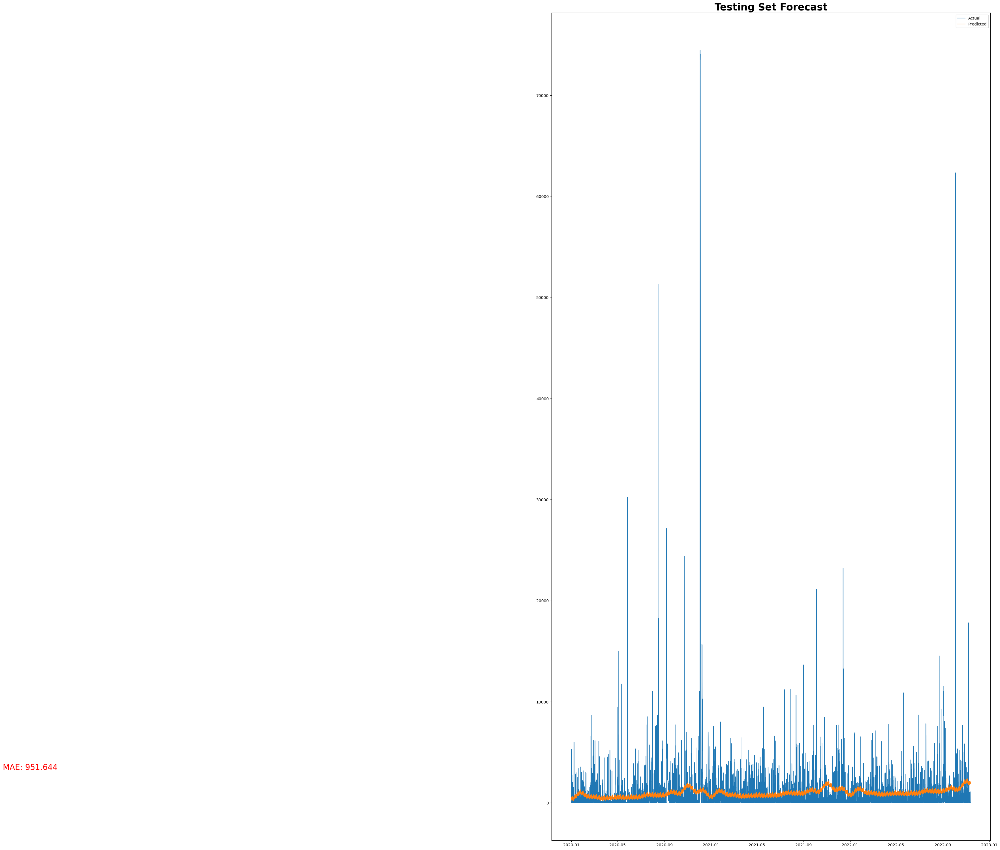

In [248]:
mae = round(mean_absolute_error(prophet_test['y'], prophet_pred['yhat']), 3)

plt.figure(figsize=(20,38))
plt.plot(prophet_test['ds'], prophet_test['y'], label='Actual')
plt.plot(prophet_pred['ds'], prophet_pred['yhat'], label='Predicted')
plt.title('Test Forecasting', weight='bold', fontsize=40)
plt.text(16770, 3250, 'MAE: {}'.format(mae), fontsize=20, color='red')
plt.title('Testing Set Forecast', weight='bold', fontsize=25)
plt.legend()

In [249]:
mae

951.644

In [250]:
# This time, we will use all data (train and test) to train our model
new_df = index_to_column(df)

In [251]:
prophet_model2 = Prophet(interval_width=0.95)
prophet_model2.fit(new_df)
# 7 days to the future (7x24 = 168)
future_dates = prophet_model2.make_future_dataframe(periods=168, freq='H')
prophet_pred2 = prophet_model2.predict(future_dates)

17:45:06 - cmdstanpy - INFO - Chain [1] start processing
17:45:26 - cmdstanpy - INFO - Chain [1] done processing


<Figure size 2000x800 with 0 Axes>

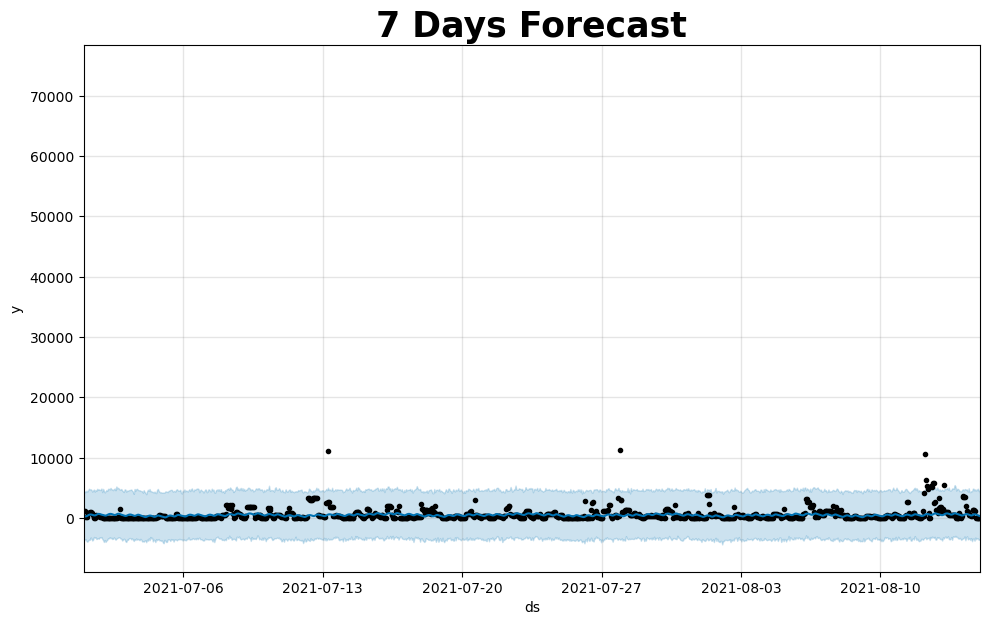

In [252]:
plt.figure(figsize=(20,8))

fig = prophet_model2.plot(prophet_pred2, uncertainty=True)
ax = fig.gca()
ax.set_xlim(pd.to_datetime(['2021-07-01', '2021-08-15']))
plt.title('7 Days Forecast', weight='bold', fontsize=25)
plt.show()

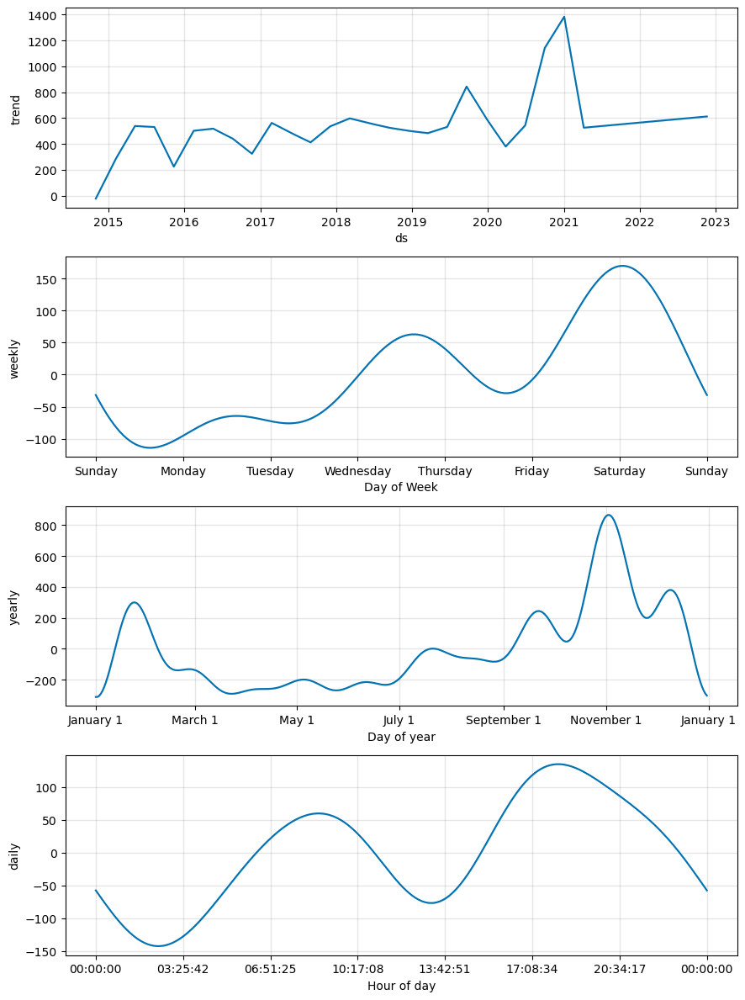

In [253]:
prophet_model.plot_components(prophet_pred2)
plt.show()

<Figure size 2000x3800 with 0 Axes>

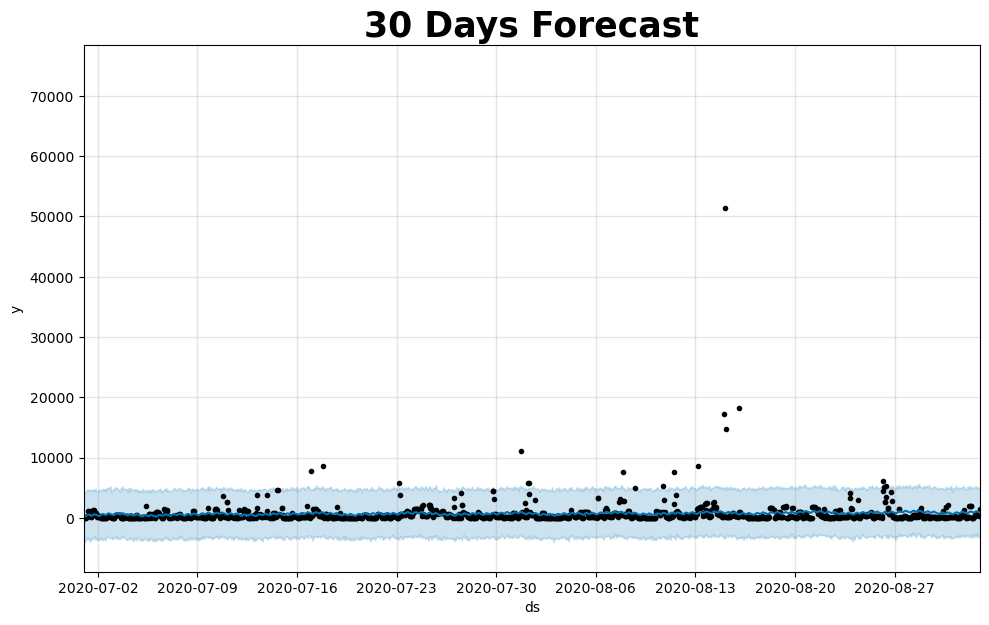

In [254]:
future_dates2 = prophet_model2.make_future_dataframe(periods=720, freq='H')
prophet_pred3 = prophet_model2.predict(future_dates2)

plt.figure(figsize=(20,38))

fig = prophet_model2.plot(prophet_pred3, uncertainty=True)
ax = fig.gca()
ax.set_xlim(pd.to_datetime(['2020-07-01', '2020-09-02']))
plt.title('30 Days Forecast', weight='bold', fontsize=25)
plt.show()

In [255]:
#xgboost

In [258]:
def date_transform(data):
    df = data.copy()
    
    df['Hour'] = df.index.hour
    df['Dayofweek'] = df.index.dayofweek
    df['Dayofmonth'] = df.index.day
    df['Dayofyear'] = df.index.dayofyear
    df['weekofyear'] = df.index.weekofyear
    df['Month'] = df.index.month
    df['Quarter'] = df.index.quarter
    df['Year'] = df.index.year
    
    X = df.drop('Highest_Outage', axis=1)
    y = df['Highest_Outage']
    
    return X, y

In [259]:
X_train, y_train = date_transform(df_train)
X_test, y_test = date_transform(df_test)

In [260]:
xgb_model = XGBRegressor(n_estimators=1000, learning_rate=0.05, early_stopping_rounds=10)
xgb_model.fit(X_train, y_train, eval_metric='mae', eval_set=[(X_train, y_train), (X_test, y_test)])
xgb_pred = xgb_model.predict(X_test)

[0]	validation_0-mae:482.37838	validation_1-mae:643.70752
[1]	validation_0-mae:472.83443	validation_1-mae:635.92545
[2]	validation_0-mae:466.05773	validation_1-mae:633.08376
[3]	validation_0-mae:460.67277	validation_1-mae:634.35935
[4]	validation_0-mae:456.75671	validation_1-mae:637.50390
[5]	validation_0-mae:454.81503	validation_1-mae:640.27274
[6]	validation_0-mae:453.20426	validation_1-mae:645.48377
[7]	validation_0-mae:452.88230	validation_1-mae:651.22797
[8]	validation_0-mae:452.97260	validation_1-mae:657.49852
[9]	validation_0-mae:452.77764	validation_1-mae:659.58627
[10]	validation_0-mae:453.93269	validation_1-mae:665.49520
[11]	validation_0-mae:454.59084	validation_1-mae:672.98719


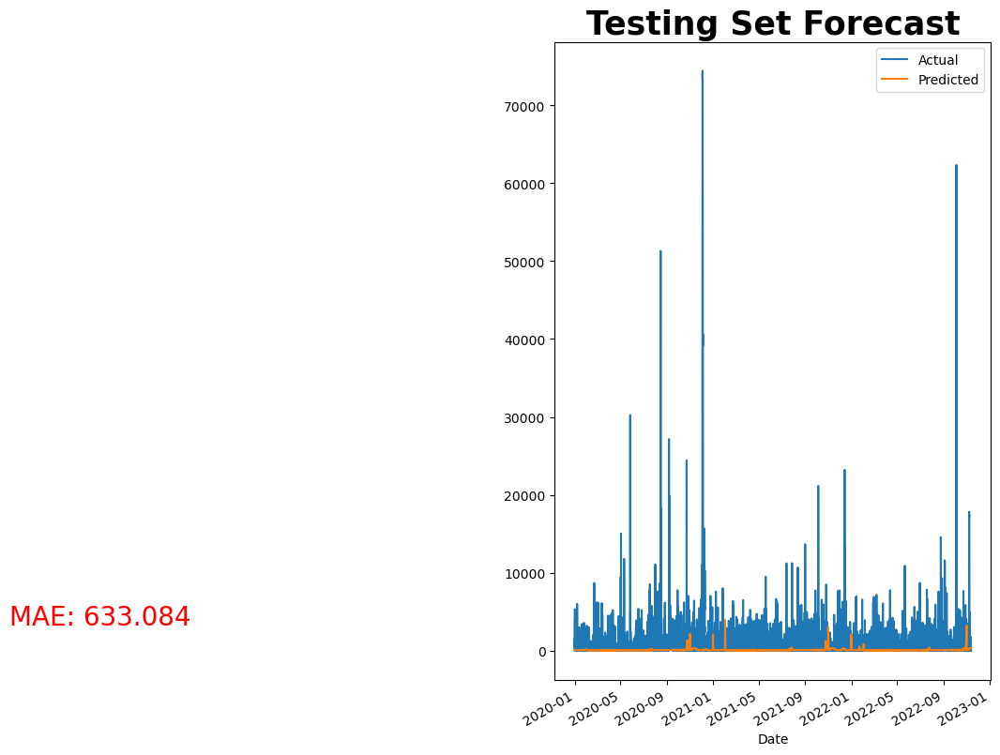

In [268]:
mae = round(mean_absolute_error(y_test, xgb_pred), 3)

df_plot = pd.DataFrame({'y_test':y_test, 'xgb_pred':xgb_pred})

plt.figure(figsize=(6,10))

df_plot['y_test'].plot(label='Actual')
df_plot['xgb_pred'].plot(label='Predicted')
plt.text(16770, 3250, 'MAE: {}'.format(mae), fontsize=20, color='red')
plt.title('Testing Set Forecast', weight='bold', fontsize=25)
plt.legend()
plt.show()

In [269]:
future_dates2 = future_dates.iloc[-168:, :].copy()

future_dates2['ds'] = pd.to_datetime(future_dates2['ds'])
future_dates2 = future_dates2.set_index('ds')

future_dates2['Hour'] = future_dates2.index.hour
future_dates2['Dayofweek'] = future_dates2.index.dayofweek
future_dates2['Dayofmonth'] = future_dates2.index.day
future_dates2['Dayofyear'] = future_dates2.index.dayofyear
future_dates2['weekofyear'] = future_dates2.index.weekofyear
future_dates2['Month'] = future_dates2.index.month
future_dates2['Quarter'] = future_dates2.index.quarter
future_dates2['Year'] = future_dates2.index.year

In [270]:
X = pd.concat([X_train, X_test], ignore_index=True)
y = pd.concat([y_train, y_test], ignore_index=True)

In [271]:
xgb_model2 = XGBRegressor(n_estimators=1000, learning_rate=0.05)
xgb_model2.fit(X, y, eval_metric='mae')
xgb_pred2 = xgb_model2.predict(future_dates2)

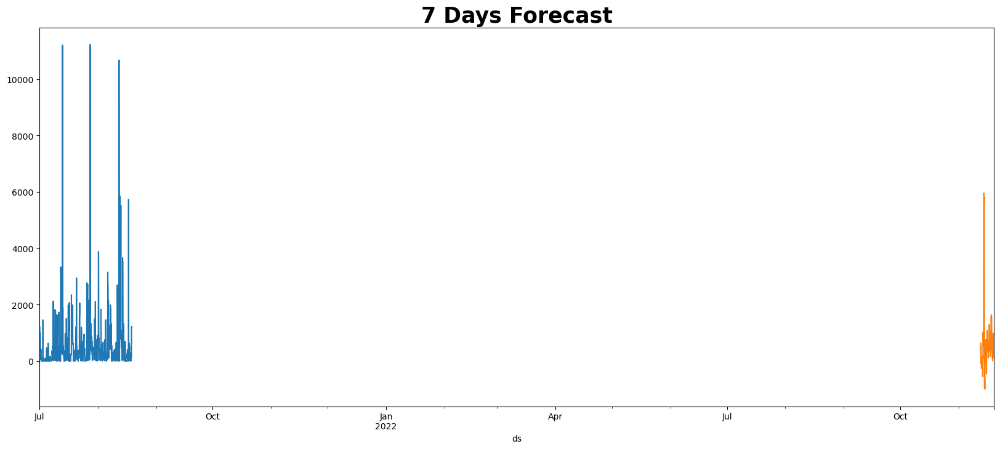

In [272]:
df_plot2 = pd.DataFrame({'Hour':future_dates2['Hour'], 'xgb_pred2':xgb_pred2})

last_week = df['2021-07-01':'2021-08-18']

plt.figure(figsize=(20,8))

last_week['Highest_Outage'].plot()
df_plot2['xgb_pred2'].plot()
plt.title('7 Days Forecast', weight='bold', fontsize=25)
plt.show()

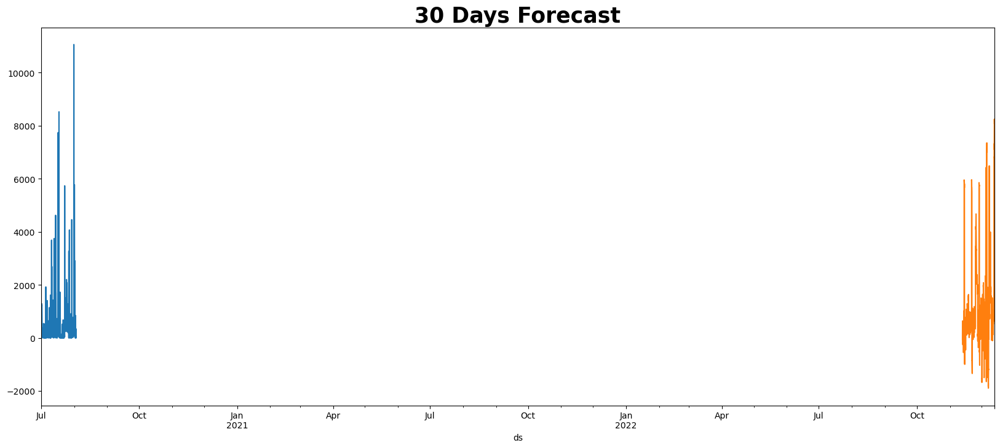

In [274]:
a = prophet_model2.make_future_dataframe(periods=720, freq='H')
future_dates3 = a.iloc[-720:, :].copy()

future_dates3['ds'] = pd.to_datetime(future_dates3['ds'])
future_dates3 = future_dates3.set_index('ds')

future_dates3['Hour'] = future_dates3.index.hour
future_dates3['Dayofweek'] = future_dates3.index.dayofweek
future_dates3['Dayofmonth'] = future_dates3.index.day
future_dates3['Dayofyear'] = future_dates3.index.dayofyear
future_dates3['weekofyear'] = future_dates3.index.weekofyear
future_dates3['Month'] = future_dates3.index.month
future_dates3['Quarter'] = future_dates3.index.quarter
future_dates3['Year'] = future_dates3.index.year

Xx = pd.concat([X_train, X_test], ignore_index=True)
yy = pd.concat([y_train, y_test], ignore_index=True)

xgb_model3 = XGBRegressor(n_estimators=1000, learning_rate=0.05)
xgb_model3.fit(Xx, yy, eval_metric='mae')
xgb_pred3 = xgb_model3.predict(future_dates3)

df_plot3 = pd.DataFrame({'Hour':future_dates3['Hour'], 'xgb_pred2':xgb_pred3})

last_week3 = df['2020-07-01':'2020-08-02']

plt.figure(figsize=(20,8))

last_week3['Highest_Outage'].plot()
df_plot3['xgb_pred2'].plot()
plt.title('30 Days Forecast', weight='bold', fontsize=25)
plt.show()

In [276]:
#deep learning model
import tensorflow as tf
dataset = tf.expand_dims(df_train['Highest_Outage'].head(10), axis=-1)

# Generate a tf dataset with 10 elements (i.e. numbers 0 to 9)
dataset = tf.data.Dataset.from_tensor_slices(dataset)

# Window the data but only take those with the specified size
dataset = dataset.window(5, shift=1, drop_remainder=True)

# Flatten the windows by putting its elements in a single batch
dataset = dataset.flat_map(lambda window: window.batch(5))

# Create tuples with features (first four elements of the window) and labels (last element)
dataset = dataset.map(lambda window: (window[:-1], window[-1]))

# # Shuffle the windows
# dataset = dataset.shuffle(buffer_size=10)

# # Create batches of windows
# dataset = dataset.batch(2).prefetch(1)

# Print the results
for x,y in dataset:
    print("x = ", x.numpy())
    print("y = ", y.numpy())
    print()

x =  [[377.]
 [  0.]
 [  0.]
 [  0.]]
y =  [0.]

x =  [[0.]
 [0.]
 [0.]
 [0.]]
y =  [3191.]

x =  [[   0.]
 [   0.]
 [   0.]
 [3191.]]
y =  [3191.]

x =  [[   0.]
 [   0.]
 [3191.]
 [3191.]]
y =  [2677.]

x =  [[   0.]
 [3191.]
 [3191.]
 [2677.]]
y =  [925.]

x =  [[3191.]
 [3191.]
 [2677.]
 [ 925.]]
y =  [1384.]



In [277]:
def windowing(data, window_size, shuffle_buffer, batch_size):
    dataset = tf.expand_dims(data, axis=-1)
    dataset = tf.data.Dataset.from_tensor_slices(dataset)
    dataset = dataset.window(window_size+1, shift=1, drop_remainder=True) # window size = 24 + 1 (test)
    dataset = dataset.flat_map(lambda window: window.batch(window_size+1))
    dataset = dataset.map(lambda window: (window[:-1], window[-1])) # (train, test) 
    dataset = dataset.shuffle(shuffle_buffer)
    dataset = dataset.batch(batch_size).prefetch(1)
    
    return dataset

In [278]:
train = windowing(df_train['Highest_Outage'], 24, 72, 32)
test = windowing(df_test['Highest_Outage'], 24, 72, 32)

In [279]:
dnn_model = tf.keras.models.Sequential([
    tf.keras.layers.Conv1D(filters=16, kernel_size=3,
                      strides=1, padding="causal",
                      activation="relu",
                      input_shape=[24,1]),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, activation='relu')),
    tf.keras.layers.Dense(16),
    tf.keras.layers.Dense(1)
])

dnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 24, 16)            64        
                                                                 
 bidirectional (Bidirection  (None, 32)                4224      
 al)                                                             
                                                                 
 dense (Dense)               (None, 16)                528       
                                                                 
 dense_1 (Dense)             (None, 1)                 17        
                                                                 
Total params: 4833 (18.88 KB)
Trainable params: 4833 (18.88 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [280]:
dnn_model.compile(loss='mae', optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
dnn_model.fit(train, validation_data=test, epochs=20)

Epoch 1/20
1409/1409 [==============================] - 21s 13ms/step - loss: 340.3659 - val_loss: 339.0961
Epoch 2/20
1409/1409 [==============================] - 17s 12ms/step - loss: 267.8344 - val_loss: 312.2873
Epoch 3/20
1409/1409 [==============================] - 17s 12ms/step - loss: 251.9146 - val_loss: 302.1877
Epoch 4/20
1409/1409 [==============================] - 18s 12ms/step - loss: 242.0325 - val_loss: 312.5917
Epoch 5/20
1409/1409 [==============================] - 17s 12ms/step - loss: 242.5794 - val_loss: 321.3761
Epoch 6/20
1409/1409 [==============================] - 17s 12ms/step - loss: 242.2908 - val_loss: 296.3723
Epoch 7/20
1409/1409 [==============================] - 17s 12ms/step - loss: 242.1391 - val_loss: 310.8618
Epoch 8/20
1409/1409 [==============================] - 17s 12ms/step - loss: 243.5866 - val_loss: 822.8188
Epoch 9/20
1409/1409 [==============================] - 17s 12ms/step - loss: 349.1632 - val_loss: 443.2982
Epoch 10/20
1409/1409 [=====

<Axes: >

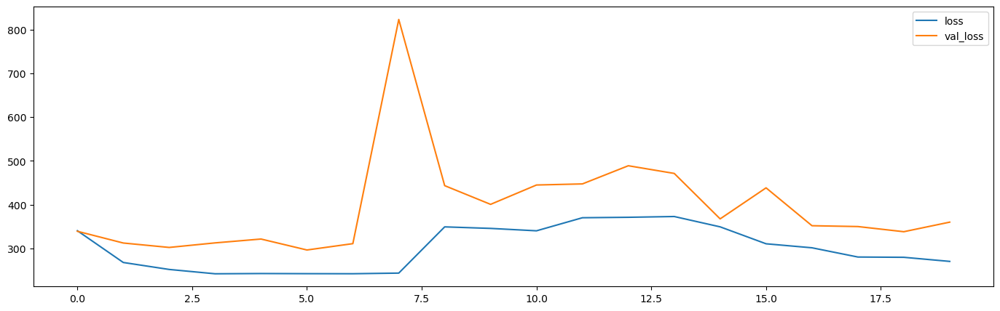

In [281]:
metric = pd.DataFrame(dnn_model.history.history)
metric.plot()

In [282]:
 results=df_test['Pred'] 

mae = round(mean_absolute_error(df_test['Highest_Outage'], df_test['Pred']), 3)

plt.figure(figsize=(20,8))

df_test['Highest_Outage'].plot(label='Actual')
df_test['Pred'].plot(label='Predicted')
plt.text(16770, 3250, 'MAE: {}'.format(mae), fontsize=20, color='red')
plt.title('Testing Set Forecast', weight='bold', fontsize=25)
plt.legend()
plt.show()

KeyError: 'Pred'

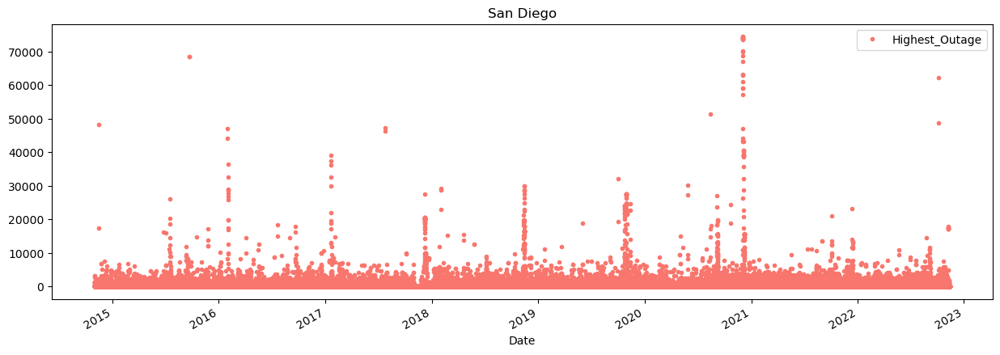

In [283]:
color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
_ = df.plot(style='.', figsize=(15,5), color=color_pal[0], title='San Diego')

In [284]:
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [285]:
X_train, y_train = create_features(df_train, label='Highest_Outage')
X_test, y_test = create_features(df_test, label='Highest_Outage')

In [286]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error
plt.style.use('fivethirtyeight')

In [287]:
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) 

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

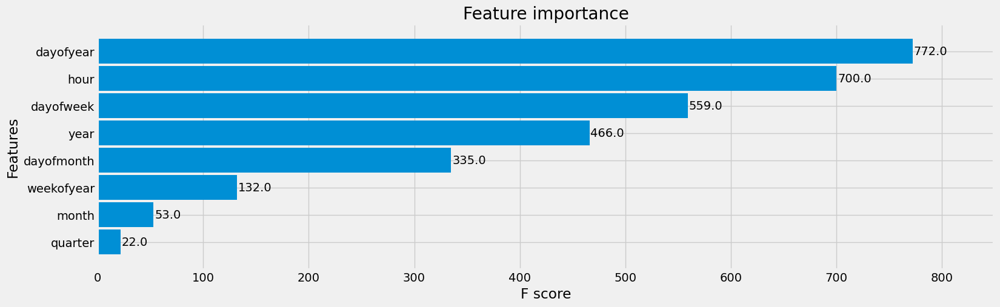

In [288]:
_ = plot_importance(reg, height=0.9)

In [289]:
df_test['Outage_Prediction'] = reg.predict(X_test)
df_all = pd.concat([df_test, df_train], sort=False)

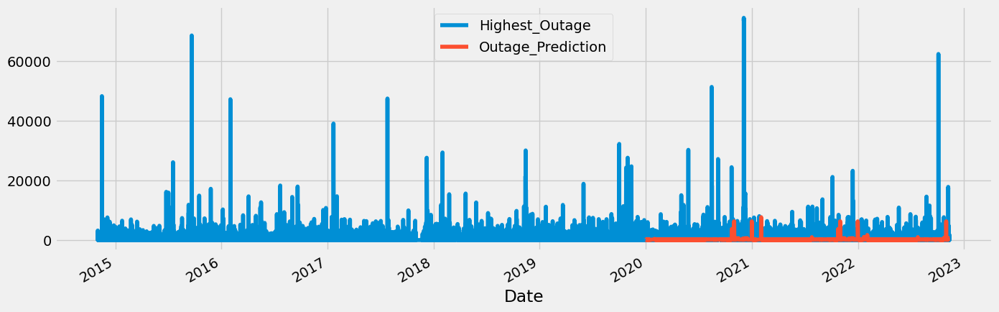

In [290]:
_ = df_all[['Highest_Outage','Outage_Prediction']].plot(figsize=(15, 5))

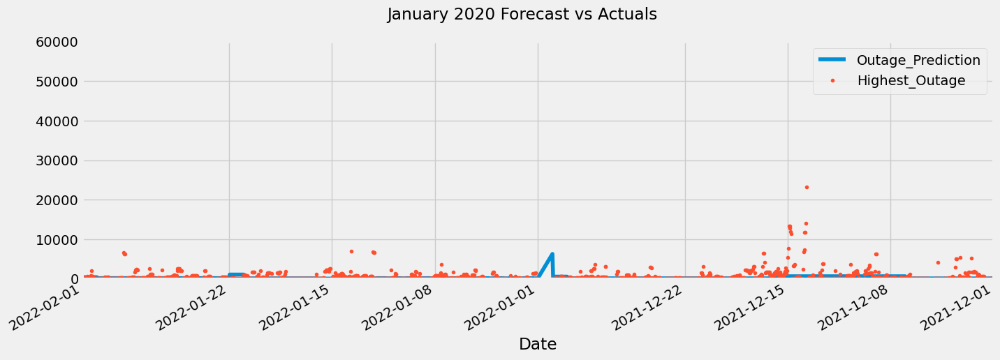

In [291]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = df_all[['Outage_Prediction','Highest_Outage']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='12-01-2021', upper='02-01-2022')
ax.set_ylim(0, 60000)
plot = plt.suptitle('January 2020 Forecast vs Actuals')

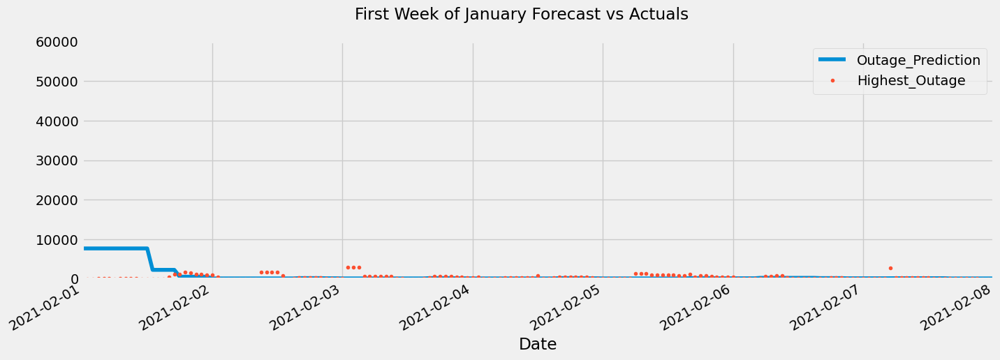

In [292]:
# Ocak Ayı ilk hafta Tahminlenen ve Gerçekleşen verileri çizelim
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = df_all[['Outage_Prediction','Highest_Outage']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='02-01-2021', upper='02-08-2021')
ax.set_ylim(0, 60000)
plot = plt.suptitle('First Week of January Forecast vs Actuals')

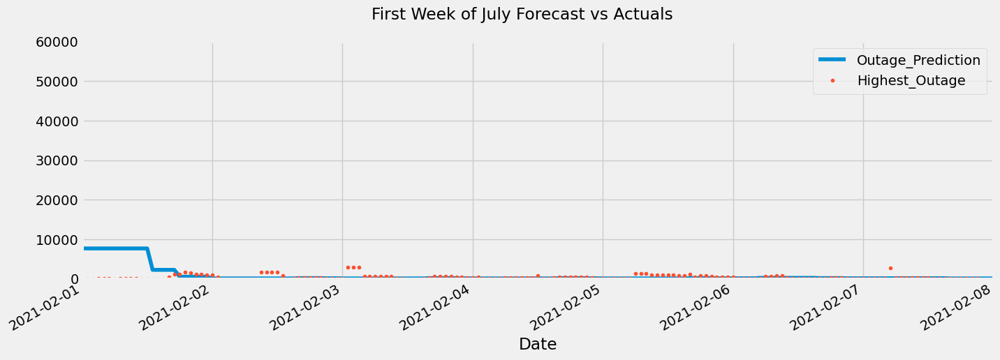

In [293]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = df_all[['Outage_Prediction','Highest_Outage']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 60000)
ax.set_xbound(lower='02-01-2021', upper='02-08-2021')
plot = plt.suptitle('First Week of July Forecast vs Actuals')

In [294]:
mean_squared_error(y_true=df_test['Highest_Outage'],
                   y_pred=df_test['Outage_Prediction'])

7361487.768118211

In [295]:
mean_absolute_error(y_true=df_test['Highest_Outage'],
                   y_pred=df_test['Outage_Prediction'])

643.6281986821472

In [296]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [297]:
mean_absolute_percentage_error(y_true=df_test['Highest_Outage'],
                   y_pred=df_test['Outage_Prediction'])

inf

In [298]:
df_test['error'] = df_test['Highest_Outage'] - df_test['Outage_Prediction']
df_test['abs_error'] = df_test['error'].apply(np.abs)
error_by_day = df_test.groupby(['year','month','dayofmonth']) \
    .mean()[['Highest_Outage','Outage_Prediction','error','abs_error']]

In [300]:

error_by_day.sort_values('error', ascending=True).head(10)

Highest_Outage  Outage_Prediction        error  \
year month dayofmonth                                                   
2021 12    31                5.000000        6272.037598 -6267.037598   
2020 12    31                6.000000        6272.037598 -6266.037598   
2021 10    31              115.833333        5405.243164 -5289.409983   
2022 10    31              197.000000        5405.243164 -5208.243317   
2021 2     1               413.000000        4744.770996 -4331.771174   
2020 10    31             1165.041667        5405.243164 -4240.201650   
2021 10    24              131.000000        3702.004150 -3571.004150   
2020 10    25              270.166667        3702.004150 -3431.837484   
           24              363.500000        3702.004150 -3338.504150   
           23              840.166667        3702.004150 -2861.837484   

                         abs_error  
year month dayofmonth               
2021 12    31          6267.037598  
2020 12    31          6266.037598  
2021 10    31          5289.409983  
2022 10    31          5208.243317  
2021 2     1           4705.316411  
2020 10    31          4240.201650  
2021 10    24          3571.004150  
2020 10    25          3431.837484  
           24          3338.504150  
           23          2861.837484

NameError: name 'error_by_day' is not defined

In [310]:
from tabulate import tabulate
# Sort the DataFrame by 'error' column in ascending order and get the top 10 rows
top_102_errors = error_by_day.sort_values('abs_error', ascending=False).head(10)

# Convert the top_10_errors DataFrame to a LaTeX table
latex_table2 = tabulate(top_102_errors, tablefmt="latex", headers="keys")

# Print the LaTeX table
print(latex_table2)

\begin{tabular}{lrrrr}
\hline
                &   Highest\_Outage &   Outage\_Prediction &    error &   abs\_error \\
\hline
 (2020, 12, 3)  &        54184.5   &             76.5769 & 54108    &    54108    \\
 (2020, 12, 4)  &        39667.2   &             76.5769 & 39590.7  &    39590.7  \\
 (2020, 12, 8)  &        13072.4   &            622.356  & 12450    &    12450    \\
 (2020, 9, 6)   &        12011.9   &            128.471  & 11883.4  &    11883.4  \\
 (2020, 9, 7)   &         7938.67  &            128.193  &  7810.47 &     7810.47 \\
 (2021, 12, 31) &            5     &           6272.04   & -6267.04 &     6267.04 \\
 (2020, 12, 31) &            6     &           6272.04   & -6266.04 &     6266.04 \\
 (2022, 11, 7)  &         6175.33  &            622.356  &  5552.98 &     5741.94 \\
 (2021, 10, 5)  &         5493.12  &            152.681  &  5340.44 &     5340.44 \\
 (2021, 10, 31) &          115.833 &           5405.24   & -5289.41 &     5289.41 \\
\hline
\end{tabular}


In [301]:
error_by_day.sort_values('abs_error', ascending=False).head(10)

Highest_Outage  Outage_Prediction         error  \
year month dayofmonth                                                    
2020 12    3             54184.541667          76.576881  54107.964785   
           4             39667.250000          76.576881  39590.673119   
           8             13072.375000         622.356323  12450.018677   
     9     6             12011.875000         128.471024  11883.403977   
           7              7938.666667         128.192825   7810.473841   
2021 12    31                5.000000        6272.037598  -6267.037598   
2020 12    31                6.000000        6272.037598  -6266.037598   
2022 11    7              6175.333333         622.356323   5552.977010   
2021 10    5              5493.125000         152.681274   5340.443731   
           31              115.833333        5405.243164  -5289.409983   

                          abs_error  
year month dayofmonth                
2020 12    3           54107.964785  
           4           39590.673119  
           8           12450.018677  
     9     6           11883.403977  
           7            7810.473841  
2021 12    31           6267.037598  
2020 12    31           6266.037598  
2022 11    7            5741.940613  
2021 10    5            5340.443731  
           31           5289.409983

In [311]:
# Sort the DataFrame by 'error' column in ascending order and get the top 10 rows
top_101_errors = error_by_day.sort_values('abs_error', ascending=True).head(10)

# Convert the top_10_errors DataFrame to a LaTeX table
latex_table1 = tabulate(top_101_errors, tablefmt="latex", headers="keys")

# Print the LaTeX table
print(latex_table1)

\begin{tabular}{lrrrr}
\hline
               &   Highest\_Outage &   Outage\_Prediction &    error &   abs\_error \\
\hline
 (2021, 7, 6)  &          54.125  &             96.0957 & -41.9707 &     48.0424 \\
 (2022, 1, 11) &          77.125  &            121.217  & -44.0917 &     49.8167 \\
 (2020, 3, 5)  &          50.3333 &             96.0957 & -45.7623 &     52.0502 \\
 (2020, 4, 14) &          49.1667 &             96.0957 & -46.929  &     54.1724 \\
 (2020, 11, 1) &          41.875  &             76.5769 & -34.7019 &     54.7371 \\
 (2020, 5, 20) &          53.125  &             96.0957 & -42.9707 &     54.8739 \\
 (2022, 6, 26) &          90.125  &            117.682  & -27.5575 &     58.1068 \\
 (2020, 4, 13) &          50.7917 &             96.0957 & -45.304  &     58.1689 \\
 (2020, 4, 15) &          66.7083 &             96.0957 & -29.3873 &     58.6937 \\
 (2021, 9, 7)  &         116.375  &            128.193  & -11.8178 &     58.9813 \\
\hline
\end{tabular}


In [302]:
error_by_day.sort_values('abs_error', ascending=True).head(10)

Highest_Outage  Outage_Prediction      error  abs_error
year month dayofmonth                                                         
2021 7     6                54.125000          96.095680 -41.970681  48.042402
2022 1     11               77.125000         121.216652 -44.091654  49.816661
2020 3     5                50.333333          96.095680 -45.762348  52.050211
     4     14               49.166667          96.095680 -46.929014  54.172405
     11    1                41.875000          76.576881 -34.701881  54.737141
     5     20               53.125000          96.095680 -42.970681  54.873859
2022 6     26               90.125000         117.682457 -27.557456  58.106792
2020 4     13               50.791667          96.095680 -45.304014  58.168898
           15               66.708333          96.095680 -29.387348  58.693703
2021 9     7               116.375000         128.192825 -11.817825  58.981315

In [312]:
# Sort the DataFrame by 'error' column in ascending order and get the top 10 rows
top_10_errors = error_by_day.sort_values('error', ascending=True).head(10)

# Convert the top_10_errors DataFrame to a LaTeX table
latex_table = tabulate(top_10_errors, tablefmt="latex", headers="keys")

# Print the LaTeX table
print(latex_table)

\begin{tabular}{lrrrr}
\hline
                &   Highest\_Outage &   Outage\_Prediction &    error &   abs\_error \\
\hline
 (2021, 12, 31) &            5     &             6272.04 & -6267.04 &     6267.04 \\
 (2020, 12, 31) &            6     &             6272.04 & -6266.04 &     6266.04 \\
 (2021, 10, 31) &          115.833 &             5405.24 & -5289.41 &     5289.41 \\
 (2022, 10, 31) &          197     &             5405.24 & -5208.24 &     5208.24 \\
 (2021, 2, 1)   &          413     &             4744.77 & -4331.77 &     4705.32 \\
 (2020, 10, 31) &         1165.04  &             5405.24 & -4240.2  &     4240.2  \\
 (2021, 10, 24) &          131     &             3702    & -3571    &     3571    \\
 (2020, 10, 25) &          270.167 &             3702    & -3431.84 &     3431.84 \\
 (2020, 10, 24) &          363.5   &             3702    & -3338.5  &     3338.5  \\
 (2020, 10, 23) &          840.167 &             3702    & -2861.84 &     2861.84 \\
\hline
\end{tabular}


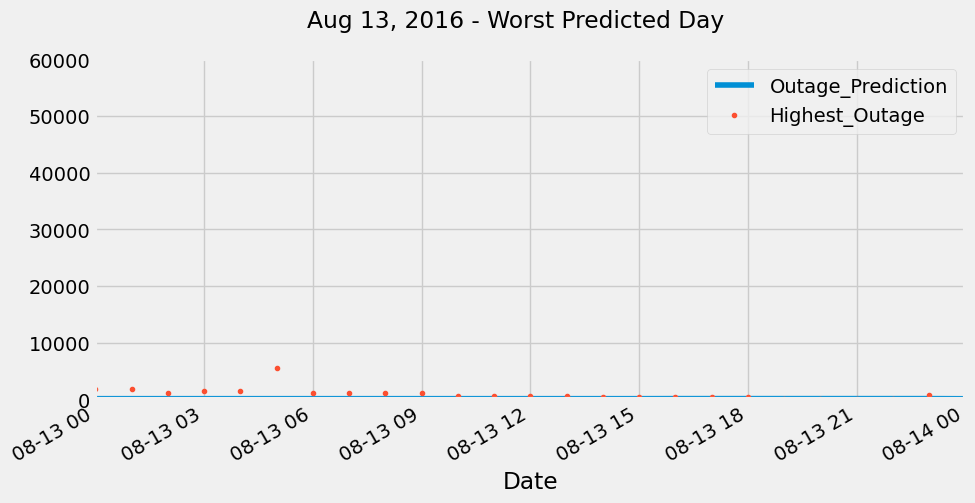

In [304]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(10)
_ = df_all[['Outage_Prediction','Highest_Outage']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 60000)
ax.set_xbound(lower='08-13-2021', upper='08-14-2021')
plot = plt.suptitle('Aug 13, 2016 - Worst Predicted Day')

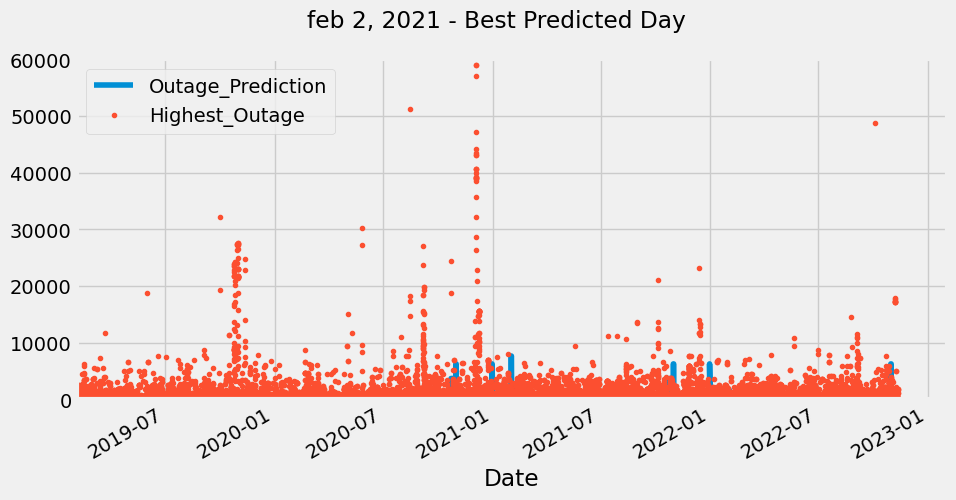

In [308]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(10)
_ = df_all[['Outage_Prediction','Highest_Outage']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 60000)
ax.set_xbound(lower='02-02-2021', upper='02-02-2021')
plot = plt.suptitle('feb 2, 2021 - Best Predicted Day')